## Описание проекта

### Вводная

Необходимо разработать решение, которое позволит персонализировать предложения постоянным клиентам, чтобы увеличить их покупательскую активность.

### Задача

1) Нужно построить модель, которая предскажет вероятность снижения покупательской активности клиента в следующие три месяца.  
2) В исследование нужно включить дополнительные данные финансового департамента о прибыльности клиента: какой доход каждый покупатель приносил компании за последние три месяца.  
3) Используя данные модели и данные о прибыльности клиентов, нужно выделить сегменты покупателей и разработать для них персонализированные предложения.

### Инструкция по выполнению проекта от заказчика

Решать задачу вам нужно в два этапа:  

1) Разработайте модель, которая предскажет вероятность снижения покупательской активности.  
2) Выделите сегмент покупателей, проанализируйте его и предложите, как увеличить его покупательскую активность. Используйте данные моделирования, данные о прибыли покупателей и исходные данные (если понадобятся). По желанию вы можете проанализировать больше одного сегмента.  

Ниже несколько примеров сегментов, но вы также можете выделить свой:  

Группа клиентов с максимальной долей покупок по акции и высокой вероятностью снижения покупательской активности.  
Группа клиентов, которые покупают только технику, то есть товары с длинным жизненным циклом.  
Группа клиентов, которые покупают товары из категории «Товары для себя» (новая категория, которую можно выделить на основе текущих) или «Товары для детей».  
Группа клиентов с высокой вероятностью снижения покупательской активности и наиболее высокой прибыльностью.  

## Подготовка к работе

In [1]:
# # здесь будем ставить все, чего нам не хватает
# !pip install --upgrade pip -q
# !pip install missingno -q
# !pip install optuna -q
# !pip install optuna-integration[sklearn] -q
# !pip install shap -q
# !pip install phik -q
# !pip install --upgrade scikit-learn -q
# !pip install tdqm -q
# !pip install imbalanced-learn -q

In [2]:
# а здесь импортировать все для работы
import warnings

import itertools

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import sklearn
import optuna
import plotly.express as px
import plotly.graph_objects as go

from IPython.display import (
    display,
    HTML
)
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.linear_model import (
    LogisticRegression,
    LinearRegression
)
from sklearn.metrics import (
    roc_auc_score,
    accuracy_score,
    f1_score
)
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    RandomizedSearchCV,
    cross_val_score
)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import (
    Pipeline,
    FeatureUnion
)
from sklearn.preprocessing import (
    OneHotEncoder,
    OrdinalEncoder,
    StandardScaler,
    MinMaxScaler,
    RobustScaler,
    LabelEncoder
)
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.inspection import permutation_importance
from optuna.integration import OptunaSearchCV
from optuna.distributions import (
    IntDistribution,
    FloatDistribution,
    CategoricalDistribution
)
from phik import phik_matrix
from statsmodels.stats.outliers_influence import variance_inflation_factor
from plotly.subplots import make_subplots
from tqdm import tqdm
from joblib import parallel_backend
from imblearn.over_sampling import SMOTE

In [3]:
# это даст нам красивые выводы
sns.set()
pd.set_option('display.float_format', lambda x: '%.2f' % x)
warnings.simplefilter(action='ignore', category=FutureWarning)

In [4]:
# здесь и дальше подготовим функции которые пригодятся в дальнейшем

In [5]:
# сделаем функцию оценки пропусков в датасетах
def missing_data(data):
    missing_data = data.isna().sum()
    missing_data = missing_data[missing_data > 0]
    display(missing_data)

In [6]:
# функция для обработки пробелов
def process_spaces(s):
    if isinstance(s, str):
        s = s.strip()
        s = ' '.join(s.split())
    return s

In [7]:
# замена пробелов на нижнее подчеркинвание в названии столбцов
def replace_spaces(s):
    if isinstance(s, str):
        s = s.strip()
        s = '_'.join(s.split())
    return s

In [8]:
def drop_duplicated(data):
    # проверка дубликатов
    display(format_display("Проверим дубликаты и удалим, если есть"))
    num_duplicates = data.duplicated().sum()
    display(num_duplicates)
    
    if num_duplicates > 0:
        display("Удаляем")
        data = data.drop_duplicates(keep='first').reset_index(drop=True)  # обновляем DataFrame
    else:
        display("Дубликаты отсутствуют")
    return data

In [9]:
# форматирования текста
def format_display(text):
    return HTML(f"<span style='font-size: 1.5em; font-weight: bold; font-style: italic;'>{text}</span>")

In [10]:
def check_data(data):
    # приведем все к нижнему регистру
    data.columns = data.columns.str.lower()
    
    # удалим лишние пробелы в строках
    data = data.applymap(process_spaces)

    # и в названии столбцов
    data.columns = [replace_spaces(col) for col in data.columns]
    
    # общая информация 
    display(format_display("Общая информация базы данных"))
    display(data.info())
    
    # 5 строк
    display(format_display("5 случайных строк"))
    display(data.sample(5))
    
    # пропуски
    display(format_display("Число пропусков в базе данных"))
    display(missing_data(data))

    # проверка на наличие пропусков
    if data.isnull().sum().sum() > 0:
        display(format_display("Визуализация пропусков"))
        msno.bar(data)
        plt.show()
        
    # средние характеристики
    display(format_display("Характеристики базы данных"))
    display(data.describe().T)
    
    data = drop_duplicated(data)
    
    return data  # возвращаем измененные данные

In [11]:
def check_unique_cat(data):
    text_columns = data.select_dtypes(include=['object'])
    
    if text_columns.empty:
        display("В DataFrame нет столбцов с данными типа 'object'.")
        return
    
    unique_values = {col: text_columns[col].unique() for col in text_columns.columns}
    for col, values in unique_values.items():
        display(f"Уникальные значения в столбце '{col}': {values}")

In [12]:
def check_numeric_columns(data):
    numeric_columns = data.select_dtypes(include=['int64', 'float64'])
    
    if numeric_columns.empty:
        return []
    else:
        return numeric_columns.columns.tolist()

In [13]:
# боксплот - только столбцы типа int и float
def plot_numerical_columns(data):
    numerical_columns = data.select_dtypes(include=['int', 'float']).columns.tolist()
    
    n = len(numerical_columns)
    ncols = 3
    nrows = (n + ncols - 1) // ncols

    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 5 * nrows))
    axs = axs.flatten()

    for i, col in enumerate(numerical_columns):
        axs[i].boxplot(data[col].dropna())
        axs[i].set_title(col)
        axs[i].set_ylabel('Значения')
        axs[i].set_xticklabels([''])

    for j in range(i + 1, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

In [14]:
def plot_numerical_columns_hist(data, target_column=None):
    numerical_columns = data.select_dtypes(include=['int', 'float']).columns.tolist()
    num_cols = len(numerical_columns)
    
    ncols = 2
    nrows = int(np.ceil(num_cols / ncols))

    f, axes = plt.subplots(nrows, ncols, figsize=(16, nrows * 4))
    axes = axes.flatten()

    for i, col in enumerate(numerical_columns):
        # Гистограмма
        axes[i].set_title(f'Распределение признака {col}', fontsize=16)
        axes[i].set_ylabel('Количество', fontsize=14)

        if target_column and target_column in data.columns:
            sns.histplot(data=data, x=col, bins=20, kde=True, ax=axes[i], hue=target_column, multiple="stack")
        else:
            sns.histplot(data=data, x=col, bins=20, kde=True, ax=axes[i])

    for j in range(i + 1, nrows * ncols):
        f.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

In [15]:
def plot_categorical_columns(data, col=None):
    categorical_columns = data.select_dtypes(include=['object']).columns.tolist()
    
    if col is not None and col in categorical_columns:
        categorical_columns = [col]
    elif col is not None:
        print(f"Столбец '{col}' не найден в данных.")
        return

    n = len(categorical_columns)
    ncols = 2
    nrows = (n * 2 + ncols - 1) // ncols

    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 6 * nrows))
    axs = axs.flatten()

    index = 0
    for col in categorical_columns:
        # круговая диаграмма
        data[col].value_counts().plot(kind='pie', ax=axs[index], autopct='%1.1f%%', startangle=90)
        axs[index].set_title(f'{col}')
        axs[index].set_ylabel('')
        index += 1

        # гистограмма
        data[col].value_counts().plot(kind='bar', ax=axs[index])
        axs[index].set_title(f'{col}')
        axs[index].set_ylabel('Частота')
        index += 1

    for j in range(index, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()


In [16]:
def plot_combined(data, target=None, legend_loc='best'):
    numerical_columns = data.select_dtypes(include=['int', 'float']).columns.tolist()

    total_plots = len(numerical_columns) * 2
    ncols = 2
    nrows = (total_plots + ncols - 1) // ncols

    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 5 * nrows))
    axs = axs.flatten()

    index = 0

    for col in numerical_columns:
        # гистограмма
        if index < len(axs):
            if target is not None:
                sns.histplot(data, x=col, hue=target, bins=20, kde=True, ax=axs[index])
                handles, labels = axs[index].get_legend_handles_labels()
                if handles:
                    axs[index].legend(title=target, loc=legend_loc)
            else:
                sns.histplot(data[col].dropna(), bins=20, kde=True, ax=axs[index])
            axs[index].set_title(f'Гистограмма: {col}')
            index += 1

        # боксплот
        if index < len(axs):
            sns.boxplot(x=data[col], ax=axs[index])
            axs[index].set_title(f'Боксплот: {col}')
            index += 1

    for j in range(index, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

In [17]:
def merge_base(bases, index, merge_type):
    """
    Объединяет список таблиц по заданному индексу.

    :param bases: Список таблиц (DataFrame), которые нужно объединить.
    :param index: Имя столбца, по которому будет происходить объединение.
    :param merge_type: Тип объединения ('inner', 'outer', 'left', 'right').
    :return: Объединённая таблица.
    """
    merged_df = bases[0]
    for base in bases[1:]:
        merged_df = pd.merge(merged_df, base, on=index, how=merge_type)

    return merged_df

In [18]:
def get_ohe_columns(data):
    # выбор бинарных признаков (категориальные с 2 уникальными значениями)
    return data.select_dtypes(include=['object']).nunique()[data.select_dtypes(include=['object']).nunique() == 2].index.tolist()

In [19]:
def get_ord_columns(data):
    # выбор категориальных признаков (с более чем 2 уникальными значениями)
    return data.select_dtypes(include=['object']).nunique()[data.select_dtypes(include=['object']).nunique() > 2].index.tolist()

In [20]:
def get_num_columns(data):
    # используем уже созданную функцию для получения количественных признаков
    return check_numeric_columns(data)

In [21]:
def plot_scatter_with_categories(data):
    """
    Функция для построения диаграмм рассеяния с разбивкой по категориальным данным.
    
    :param data: DataFrame с данными.
    """
    categorical_columns = data.select_dtypes(include=['object', 'category']).columns.tolist()
    
    for column in categorical_columns:
        plt.figure(figsize=(15, 10))
        sns.scatterplot(data=data, x='вероятность_снижения', y='прибыль', hue=column, alpha=0.7)
        plt.xlabel('Вероятность снижения активности')
        plt.ylabel('Прибыль')
        plt.title(f'Зависимость вероятности снижения активности от прибыли по {column}')
        plt.legend(title=column)
        plt.show()

In [22]:
def histogram(data, col, target):
    plt.figure(figsize=(8,6))
    plot = sns.histplot(data, bins=20, kde=True, hue=target, x=col)
    plot.set_title(f'Рапределение по {col}', fontsize=16)
    plot.set_ylabel('Количество', fontsize=14)

In [23]:
def plot_density_heatmap(data, x, y):
    fig = px.density_heatmap(data, x=x, y=y, nbinsx=50, nbinsy=50, color_continuous_scale='Greens')
    fig.update_layout(title=f'Зависимость {x} от {y}',
                      xaxis_title=x,
                      yaxis_title=y,
                      width=600,
                      height=500)
    fig.show()

## Загрузка данных

In [24]:
# Таблица, которая содержит данные о поведении покупателя на сайте,
# о коммуникациях с покупателем и его продуктовом поведении.
market_file = pd.read_csv('https://code.s3.yandex.net/datasets/market_file.csv')

In [25]:
# Таблица с данными о выручке, которую получает магазин с покупателя,
# то есть сколько покупатель всего потратил за период взаимодействия с сайтом.
market_money = pd.read_csv('https://code.s3.yandex.net/datasets/market_money.csv')

In [26]:
# Таблица с данными о времени (в минутах), которое покупатель провёл на сайте в течение периода.
market_time = pd.read_csv('https://code.s3.yandex.net/datasets/market_time.csv')

In [27]:
# Таблица с данными о среднемесячной прибыли продавца за последние 3 месяца:
# какую прибыль получает магазин от продаж каждому покупателю.
money = pd.read_csv('https://code.s3.yandex.net/datasets/money.csv', delimiter=';', decimal = ',')

### market_file

In [28]:
# посмотрим, что у нас в каждом файле имеется
# обработкой, доработкой и преобразованиями займемся позже
market_file = check_data(market_file)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1300 non-null   int64  
 1   покупательская_активность            1300 non-null   object 
 2   тип_сервиса                          1300 non-null   object 
 3   разрешить_сообщать                   1300 non-null   object 
 4   маркет_актив_6_мес                   1300 non-null   float64
 5   маркет_актив_тек_мес                 1300 non-null   int64  
 6   длительность                         1300 non-null   int64  
 7   акционные_покупки                    1300 non-null   float64
 8   популярная_категория                 1300 non-null   object 
 9   средний_просмотр_категорий_за_визит  1300 non-null   int64  
 10  неоплаченные_продукты_штук_квартал   1300 non-null   int64  
 11  ошибка_сервиса                

None

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
130,215478,Снизилась,стандарт,да,4.10,4,753,0.24,Товары для детей,2,8,2,2
984,216332,Прежний уровень,стандарт,да,4.30,4,975,0.16,Товары для детей,2,2,8,8
194,215542,Снизилась,стандарт,нет,3.40,4,622,0.28,Косметика и аксесуары,3,1,4,4
99,215447,Снизилась,стандарт,да,2.40,5,511,0.94,Товары для детей,3,2,3,3
392,215740,Снизилась,премиум,нет,3.50,4,769,0.30,Домашний текстиль,3,3,6,7


Series([], dtype: int64)

None

,count,mean,std,min,25%,50%,75%,max
id,1300.00,215997.50,375.42,215348.00,215672.75,215997.50,216322.25,216647.00
маркет_актив_6_мес,1300.00,4.25,1.01,0.90,3.70,4.20,4.90,6.60
маркет_актив_тек_мес,1300.00,4.01,0.70,3.00,4.00,4.00,4.00,5.00
длительность,1300.00,601.90,249.86,110.00,405.50,606.00,806.00,1079.00
акционные_покупки,1300.00,0.32,0.25,0.00,0.17,0.24,0.30,0.99
средний_просмотр_категорий_за_визит,1300.00,3.27,1.36,1.00,2.00,3.00,4.00,6.00
неоплаченные_продукты_штук_квартал,1300.00,2.84,1.97,0.00,1.00,3.00,4.00,10.00
ошибка_сервиса,1300.00,4.19,1.96,0.00,3.00,4.00,6.00,9.00
страниц_за_визит,1300.00,8.18,3.98,1.00,5.00,8.00,11.00,20.00


0

'Дубликаты отсутствуют'

### market_money

In [29]:
market_money = check_data(market_money)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       3900 non-null   int64  
 1   период   3900 non-null   object 
 2   выручка  3900 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 91.5+ KB


None

,id,период,выручка
1457,215833,препредыдущий_месяц,5204.00
2794,216279,предыдущий_месяц,5573.50
2721,216255,предыдущий_месяц,5107.50
2927,216323,текущий_месяц,6722.00
638,215560,препредыдущий_месяц,4931.00


Series([], dtype: int64)

None

,count,mean,std,min,25%,50%,75%,max
id,3900.00,215997.50,375.33,215348.00,215672.75,215997.50,216322.25,216647.00
выручка,3900.00,5025.70,1777.70,0.00,4590.15,4957.50,5363.00,106862.20


0

'Дубликаты отсутствуют'

### market_time

In [30]:
market_time = check_data(market_time)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2600 non-null   int64 
 1   период  2600 non-null   object
 2   минут   2600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 61.1+ KB


None

,id,период,минут
994,215845,текущий_месяц,18
275,215485,текущий_месяц,14
1764,216230,текущий_месяц,8
1717,216206,текущий_месяц,9
2462,216579,текущий_месяц,21


Series([], dtype: int64)

None

,count,mean,std,min,25%,50%,75%,max
id,2600.00,215997.50,375.35,215348.00,215672.75,215997.50,216322.25,216647.00
минут,2600.00,13.34,4.08,4.00,10.00,13.00,16.00,23.00


0

'Дубликаты отсутствуют'

### money

In [31]:
money = check_data(money)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1300 non-null   int64  
 1   прибыль  1300 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 20.4 KB


None

,id,прибыль
79,215427,2.76
1278,216626,4.45
202,215550,4.20
1004,216352,5.27
900,216248,5.12


Series([], dtype: int64)

None

,count,mean,std,min,25%,50%,75%,max
id,1300.00,215997.50,375.42,215348.00,215672.75,215997.50,216322.25,216647.00
прибыль,1300.00,4.00,1.01,0.86,3.30,4.04,4.67,7.43


0

'Дубликаты отсутствуют'

### Выводы

Требуется небольшая обработка типов данных:  
1) market_file:  
маркет_актив_6_мес - object - > float  
акционные_покупки - object - > float  

2) market_money:  
выручка - object - > float  

3) money - есть подозрение, что здесь не единицы, а тысячи должны быть

4) в market_time и market_money есть значение период, но они несут разный смысл   

## Предобработка данных

### Обработка данных

In [32]:
# изменение типов данных в market_file
market_file['маркет_актив_6_мес'] = market_file['маркет_актив_6_мес'].astype(float)
market_file['акционные_покупки'] = market_file['акционные_покупки'].astype(float)

# изменение типов данных в market_money
market_money['выручка'] = market_money['выручка'].astype(float)

# изменим значения
money['прибыль'] = money['прибыль'] * 1000

In [33]:
# т.к. нам пришлось менять тип данных в не которых позициях, посмотрим еще раз на статистику
market_file.describe().T

,count,mean,std,min,25%,50%,75%,max
id,1300.00,215997.50,375.42,215348.00,215672.75,215997.50,216322.25,216647.00
маркет_актив_6_мес,1300.00,4.25,1.01,0.90,3.70,4.20,4.90,6.60
маркет_актив_тек_мес,1300.00,4.01,0.70,3.00,4.00,4.00,4.00,5.00
длительность,1300.00,601.90,249.86,110.00,405.50,606.00,806.00,1079.00
акционные_покупки,1300.00,0.32,0.25,0.00,0.17,0.24,0.30,0.99
средний_просмотр_категорий_за_визит,1300.00,3.27,1.36,1.00,2.00,3.00,4.00,6.00
неоплаченные_продукты_штук_квартал,1300.00,2.84,1.97,0.00,1.00,3.00,4.00,10.00
ошибка_сервиса,1300.00,4.19,1.96,0.00,3.00,4.00,6.00,9.00
страниц_за_визит,1300.00,8.18,3.98,1.00,5.00,8.00,11.00,20.00


В целом все выглядит нормально

In [34]:
money.describe().T

,count,mean,std,min,25%,50%,75%,max
id,1300.00,215997.50,375.42,215348.00,215672.75,215997.50,216322.25,216647.00
прибыль,1300.00,3996.63,1013.72,860.00,3300.00,4045.00,4670.00,7430.00


И прибыль стала выглядеть правдоподобнее

In [35]:
market_money.describe().T

,count,mean,std,min,25%,50%,75%,max
id,3900.00,215997.50,375.33,215348.00,215672.75,215997.50,216322.25,216647.00
выручка,3900.00,5025.70,1777.70,0.00,4590.15,4957.50,5363.00,106862.20


In [36]:
# а вот тут не очень, почему-то минимальная выручка 0 (да, продавец может уйти и в минус, и не продать ничего, надо проверить)
display(market_money[market_money['выручка'] == 0])
# и есть очень большая выручка в 106862.20, а у нас таких значений в прибыли не наблюдается
display(market_money[market_money['выручка'] > 10000])

,id,период,выручка
0,215348,препредыдущий_месяц,0.00
2,215348,предыдущий_месяц,0.00
28,215357,препредыдущий_месяц,0.00
29,215357,предыдущий_месяц,0.00
34,215359,предыдущий_месяц,0.00
35,215359,препредыдущий_месяц,0.00


,id,период,выручка
98,215380,текущий_месяц,106862.20


In [37]:
# исправим на медианное значение, явно ошибка, т.к. среднее значение всего ~5000
median_value = market_money[market_money['выручка'] < 10000]['выручка'].median()
market_money.loc[market_money['выручка'] > 10000, 'выручка'] = median_value

В целом допускаем, что выручка может быть такая - вдруг ничего не продали  
или наоборот - выкупили все, что только можно было, но сдается мне явно не в этом случае

### Обработка неявных дубликатов

In [38]:
check_unique_cat(market_file)

"Уникальные значения в столбце 'покупательская_активность': ['Снизилась' 'Прежний уровень']"

"Уникальные значения в столбце 'тип_сервиса': ['премиум' 'стандартт' 'стандарт']"

"Уникальные значения в столбце 'разрешить_сообщать': ['да' 'нет']"

"Уникальные значения в столбце 'популярная_категория': ['Товары для детей' 'Домашний текстиль' 'Косметика и аксесуары'\n 'Техника для красоты и здоровья' 'Кухонная посуда'\n 'Мелкая бытовая техника и электроника']"

In [39]:
# исправим "стандартт" и "...аксесуары"
market_file.loc[market_file['тип_сервиса'] == 'стандартт', 'тип_сервиса'] = 'стандарт'
market_file.loc[market_file['популярная_категория'] == 'Косметика и аксесуары', 'популярная_категория'] = 'Косметика и аксессуары'

In [40]:
check_unique_cat(market_money)

"Уникальные значения в столбце 'период': ['препредыдущий_месяц' 'текущий_месяц' 'предыдущий_месяц']"

In [41]:
check_unique_cat(market_time)

"Уникальные значения в столбце 'период': ['текущий_месяц' 'предыдцщий_месяц']"

In [42]:
# ну тоже, как то странно выглядит.... исправим предыдцщий_месяц на предыдущий_месяц
market_time.loc[market_time['период'] == 'предыдцщий_месяц', 'период'] = 'предыдущий_месяц'

In [43]:
check_unique_cat(money)

"В DataFrame нет столбцов с данными типа 'object'."

Ну вот и ладненько

## Исследовательский анализ данных

### market_file

In [44]:
base = market_file.drop(columns=['id'])

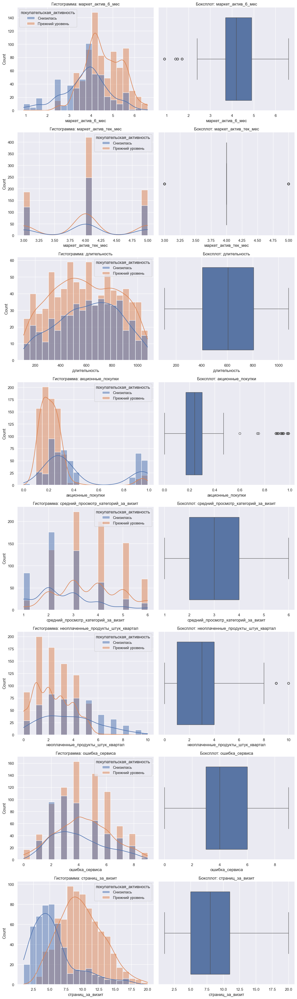

In [45]:
plot_combined(base, 'покупательская_активность')

По выбросам: все в рамках нормы, ничего критичного не наблюдается.  

По распределениям, снижение активности в большей степени наблюдается у тех кто покупает по акциям/скидкам, кто долго не оплачивает покупки в корзине, они смотрят меньше категорий и в принципе у них низкая активность на сайте

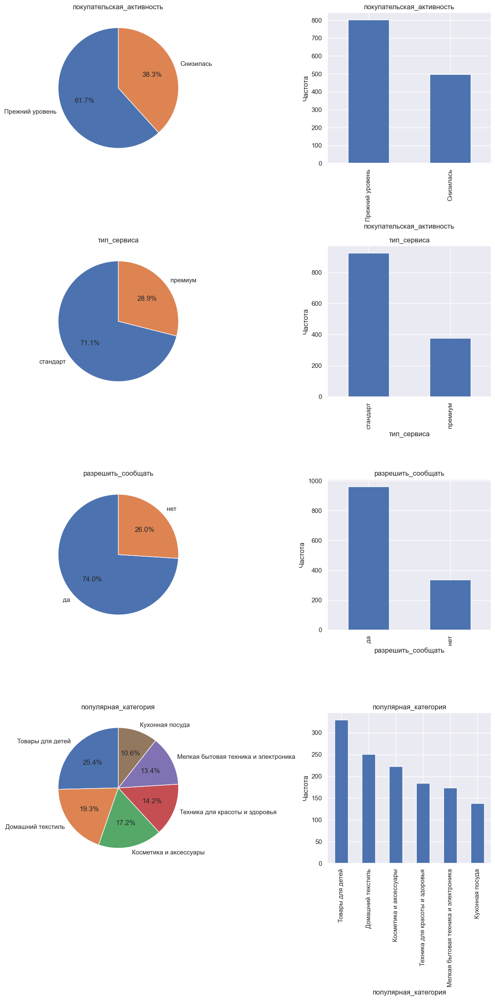

In [46]:
plot_categorical_columns(market_file)

По динамике:  
1) покупательская активность - преобладает в большинстве своем на прежнем уровне  
2) тип сервиса - большинство на стандарте  
3) разрешить сообщать - большинство непротив уведомлений  
4) популярная категория - на 1м месте товары для детей, на 2м домашний текстиль  

### market_money

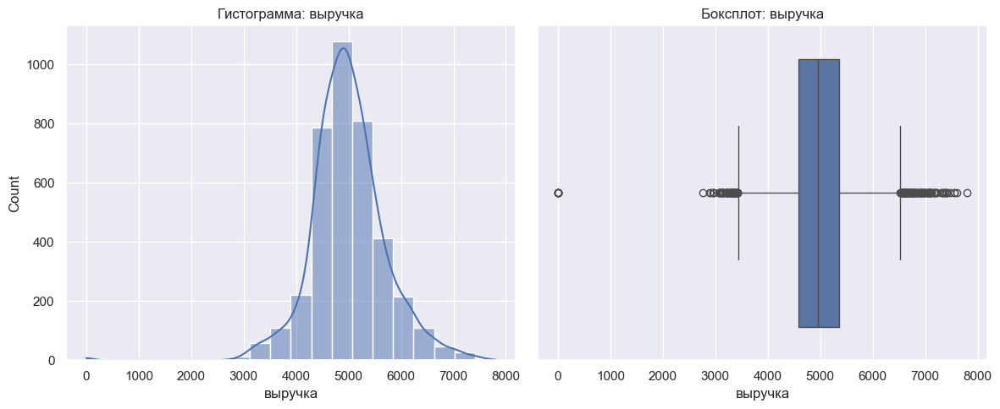

In [47]:
base = market_money.drop(columns=['id'])
grp = pd.DataFrame(base.groupby('период')['выручка'].sum())
plot_combined(base)

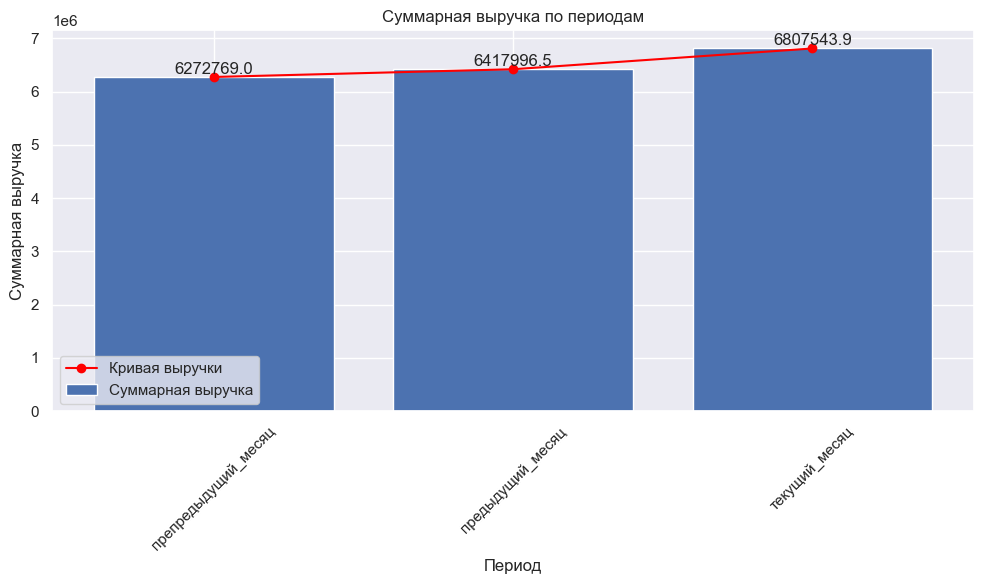

In [48]:
ordered_periods = ['препредыдущий_месяц', 'предыдущий_месяц', 'текущий_месяц']
base['период'] = pd.Categorical(base['период'], categories=ordered_periods, ordered=True)

grouped_data = base.groupby('период')['выручка'].sum().reset_index()
plt.figure(figsize=(10, 6))

bars = plt.bar(grouped_data['период'], grouped_data['выручка'], label='Суммарная выручка')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), 
             ha='center', va='bottom')

plt.plot(grouped_data['период'], grouped_data['выручка'], color='red', marker='o', label='Кривая выручки')

plt.xlabel('Период')
plt.ylabel('Суммарная выручка')
plt.title('Суммарная выручка по периодам')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

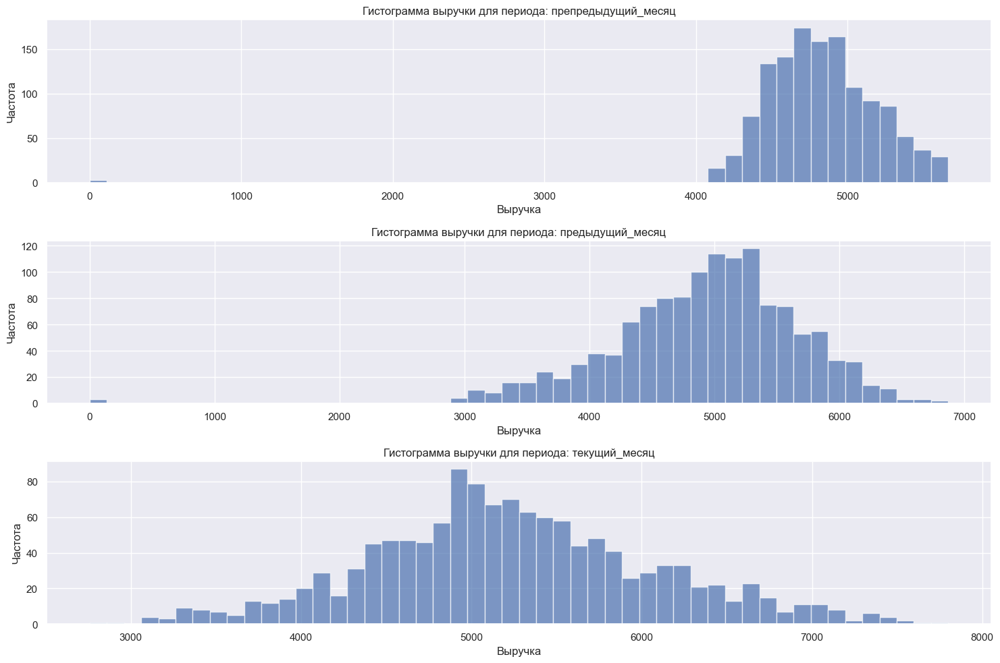

In [49]:
base['период'] = pd.Categorical(base['период'], categories=ordered_periods, ordered=True)

plt.figure(figsize=(15, 10))

for i, period in enumerate(ordered_periods):
    plt.subplot(len(ordered_periods), 1, i + 1)
    subset = base[base['период'] == period]
    plt.hist(subset['выручка'], bins=50, alpha=0.7)
    plt.title(f'Гистограмма выручки для периода: {period}')
    plt.xlabel('Выручка')
    plt.ylabel('Частота')

plt.tight_layout()
plt.show()

По всей видимости, сервис не так давно на рынке.  
Когда он появился - люди тратили сразу и много.  
А со временем затраты стали "размазываться".  
Но т.к. выручка в разрезе периода только растет, скорее всего больше появилось новичков, а старичку уже купили все, что им надо.

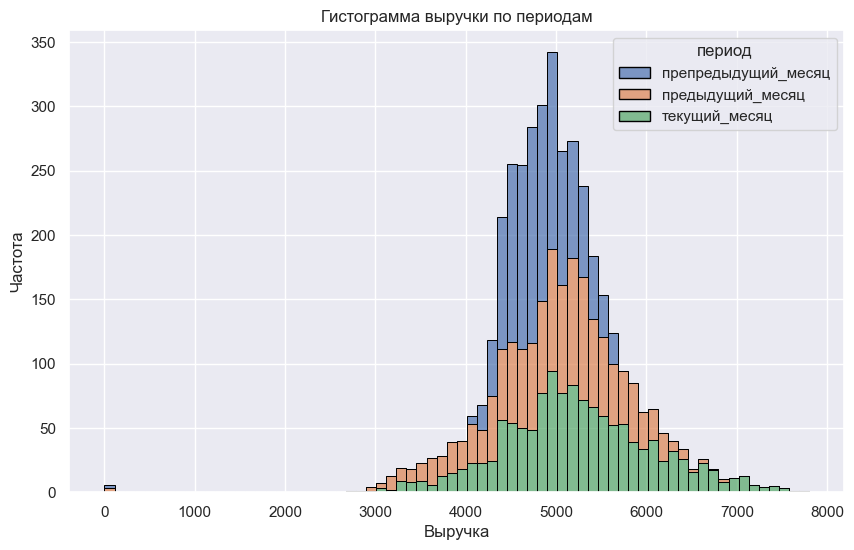

In [50]:
base['период'] = pd.Categorical(base['период'], categories=ordered_periods, ordered=True)

plt.figure(figsize=(10, 6))

sns.histplot(data=base, x='выручка', hue='период', multiple='stack', bins=70, alpha=0.7, edgecolor='black')

plt.title('Гистограмма выручки по периодам')
plt.xlabel('Выручка')
plt.ylabel('Частота')

plt.show()

В целом, после корректировки выброса, ничего страшного не вижу.  
А выручка стала расти, в среднем на 200000, из месяца в месяц.

In [51]:
# Отберите клиентов с покупательской активностью не менее трёх месяцев,
# то есть таких, которые что-либо покупали в этот период.
# нам нужна таблица market_money, где помесячно указана выручка от каждого клиета
# посчитаем...

active_clients = market_money.groupby(['id', 'период']).sum().reset_index()

valid_ids = active_clients.groupby('id').filter(lambda x: (x['выручка'] != 0).all())

unique_ids = len(market_money['id'].unique())
valid_unique_ids = len(valid_ids['id'].unique())

market_money = market_money[market_money['id'].isin(valid_ids['id'])]
display(f"Общее количество уникальных id: {unique_ids}")
display(f"Количество id с выручкой всегда больше 0: {valid_unique_ids}")

'Общее количество уникальных id: 1300'

'Количество id с выручкой всегда больше 0: 1297'

Таким образом, оказалось, что только 3 клиента хотя бы раз пропустили покупки в одном из отчетных месяцев

### market_time

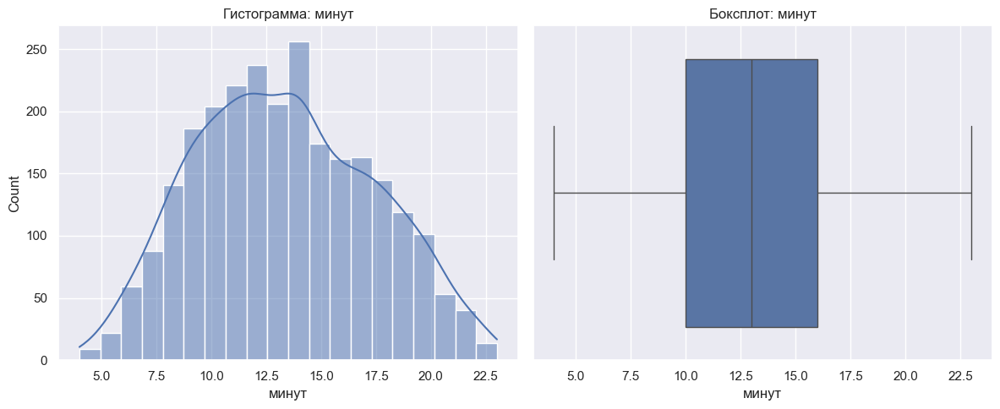

In [52]:
base = market_time.drop(columns=['id'])
plot_combined(base)

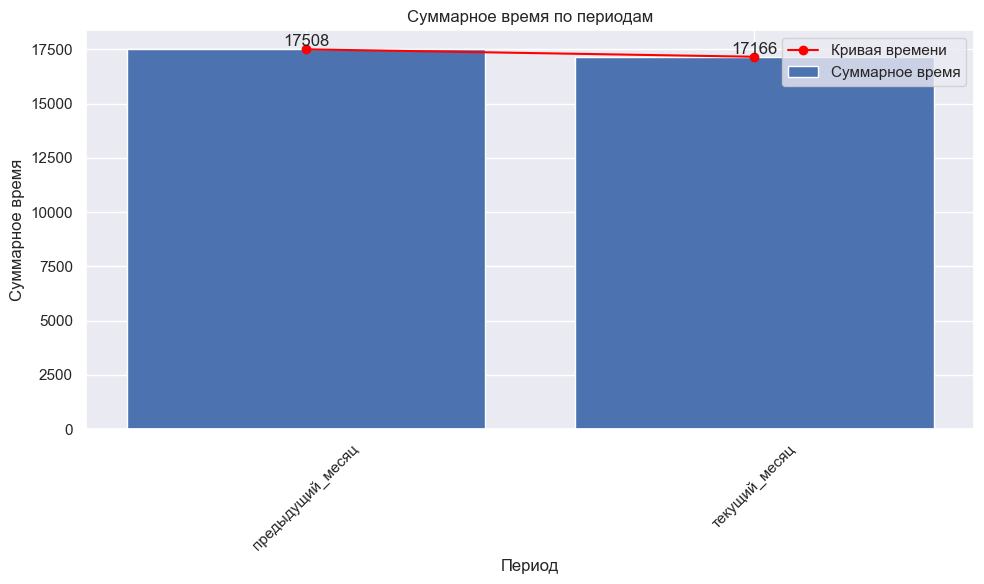

In [53]:
ordered_periods = ['предыдущий_месяц', 'текущий_месяц']
base['период'] = pd.Categorical(base['период'], categories=ordered_periods, ordered=True)

grouped_data = base.groupby('период')['минут'].sum().reset_index()
plt.figure(figsize=(10, 6))

bars = plt.bar(grouped_data['период'], grouped_data['минут'], label='Суммарное время')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), 
             ha='center', va='bottom')  # Подпись над столбцом

plt.plot(grouped_data['период'], grouped_data['минут'], color='red', marker='o', label='Кривая времени')

plt.xlabel('Период')
plt.ylabel('Суммарное время')
plt.title('Суммарное время по периодам')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

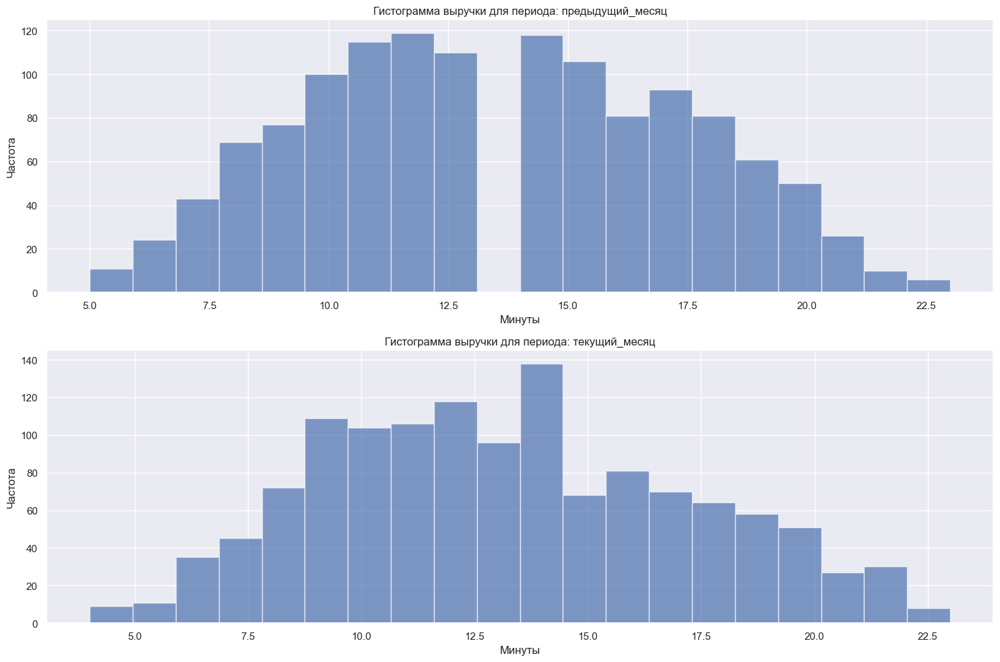

In [54]:
base['период'] = pd.Categorical(base['период'], categories=ordered_periods, ordered=True)

plt.figure(figsize=(15, 10))

for i, period in enumerate(ordered_periods):
    plt.subplot(len(ordered_periods), 1, i + 1)
    subset = base[base['период'] == period]
    plt.hist(subset['минут'], bins=20, alpha=0.7)
    plt.title(f'Гистограмма выручки для периода: {period}')
    plt.xlabel('Минуты')
    plt.ylabel('Частота')

plt.tight_layout()
plt.show()

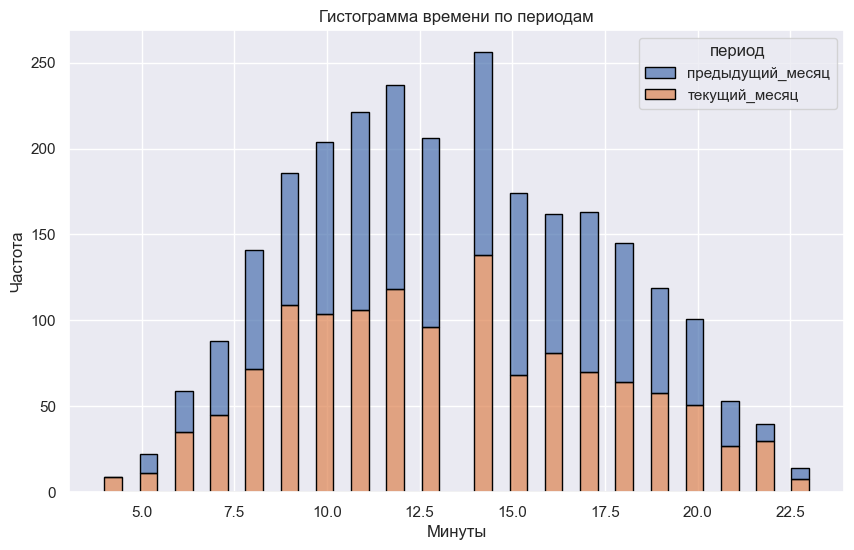

In [55]:
base['период'] = pd.Categorical(base['период'], categories=ordered_periods, ordered=True)

plt.figure(figsize=(10, 6))

sns.histplot(data=base, x='минут', hue='период', multiple='stack', bins=40, alpha=0.7, edgecolor='black')

plt.title('Гистограмма времени по периодам')
plt.xlabel('Минуты')
plt.ylabel('Частота')

plt.show()

Интересно, на общих графиках - время не сильно просело, а тут это достаточно заметно...  
Да и в целом, стали меньше сидеть на сайте в сравнении предыдущим периодом.  

Есть несколько идей, почему так:  
1) Сайт стал сложнее в понимании;   
2) Шопоголики просто уже не знают, что купить  

### money

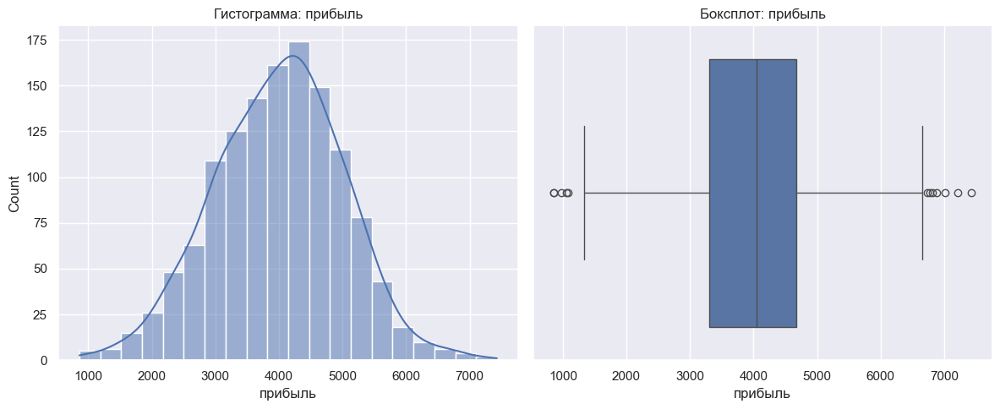

In [56]:
base = money.drop(columns=['id'])
plot_combined(base)

Ну, тут тоже все хорошо, по крайней мере в рамках допустимого

### Выводы

В целом - выбросы в пределах нормы.  
Единственное, хочется отметить, что категориальные данные не сбалансированы,в том числе и таргет, и это надо будет учитывать при обучении

## Объединение таблиц

### Объединение

Объедините таблицы market_file.csv, market_money.csv, market_time.csv

In [57]:
market_money_grouped = market_money.pivot_table(index=['id'], columns=["период"])
market_money_grouped.columns = ['выручка_предыдущий_месяц', 'выручка_препредыдущий_месяц', 'выручка_текущий_месяц']
market_money_grouped['id'] = market_money_grouped.index

In [58]:
market_time_grouped = market_time.pivot_table(index=['id'], columns=["период"])
market_time_grouped.columns = ['минут_предыдущий_месяц', 'минут_текущий_месяц']
market_time_grouped['id'] = market_time_grouped.index

In [59]:
market_money_grouped = market_money_grouped.rename(columns={'id': 'id_money'})
market_time_grouped = market_time_grouped.rename(columns={'id': 'id_time'})
market = market_file.join(market_money_grouped, on='id', lsuffix="_left", rsuffix="_выручка")
market = market.rename(columns={'id_left': 'id'})
market = market.join(market_time_grouped, on='id', lsuffix="_left", rsuffix="_минут")
market = market.rename(columns={'id_left': 'id'})
market = market.drop(['id_money', 'id_time'], axis=1)

In [60]:
# помним, что у нас есть 3 клиента которых надо убрать
market[market.isna().any(axis=1)]

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц
0,215348,Снизилась,премиум,да,3.40,5,121,0.00,Товары для детей,6,2,1,5,NaN,NaN,NaN,13.00,14.00
9,215357,Снизилась,стандарт,да,3.90,5,154,0.00,Техника для красоты и здоровья,3,3,9,5,NaN,NaN,NaN,12.00,6.00
11,215359,Снизилась,стандарт,да,4.60,5,110,0.00,Домашний текстиль,4,2,4,2,NaN,NaN,NaN,13.00,11.00


In [61]:
market = market.dropna()

In [62]:
market.sample(3)

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц
413,215761,Прежний уровень,стандарт,нет,5.70,4,565,0.14,Домашний текстиль,5,1,4,12,4252.00,5023.00,3713.80,12.00,18.00
562,215910,Снизилась,стандарт,нет,3.90,3,509,0.95,Косметика и аксессуары,2,6,4,5,5360.00,4874.00,5911.20,11.00,17.00
177,215525,Снизилась,стандарт,да,3.00,4,558,0.32,Товары для детей,1,2,4,1,4769.50,4639.00,4984.00,9.00,10.00


### Выводы

Таблицы объединили, но таким образом, что теперь за каждым ID только одна единственная строчка

## Корреляционный анализ

### Анализ

interval columns not set, guessing: ['маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность', 'акционные_покупки', 'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', 'страниц_за_визит', 'выручка_предыдущий_месяц', 'выручка_препредыдущий_месяц', 'выручка_текущий_месяц', 'минут_предыдущий_месяц', 'минут_текущий_месяц']


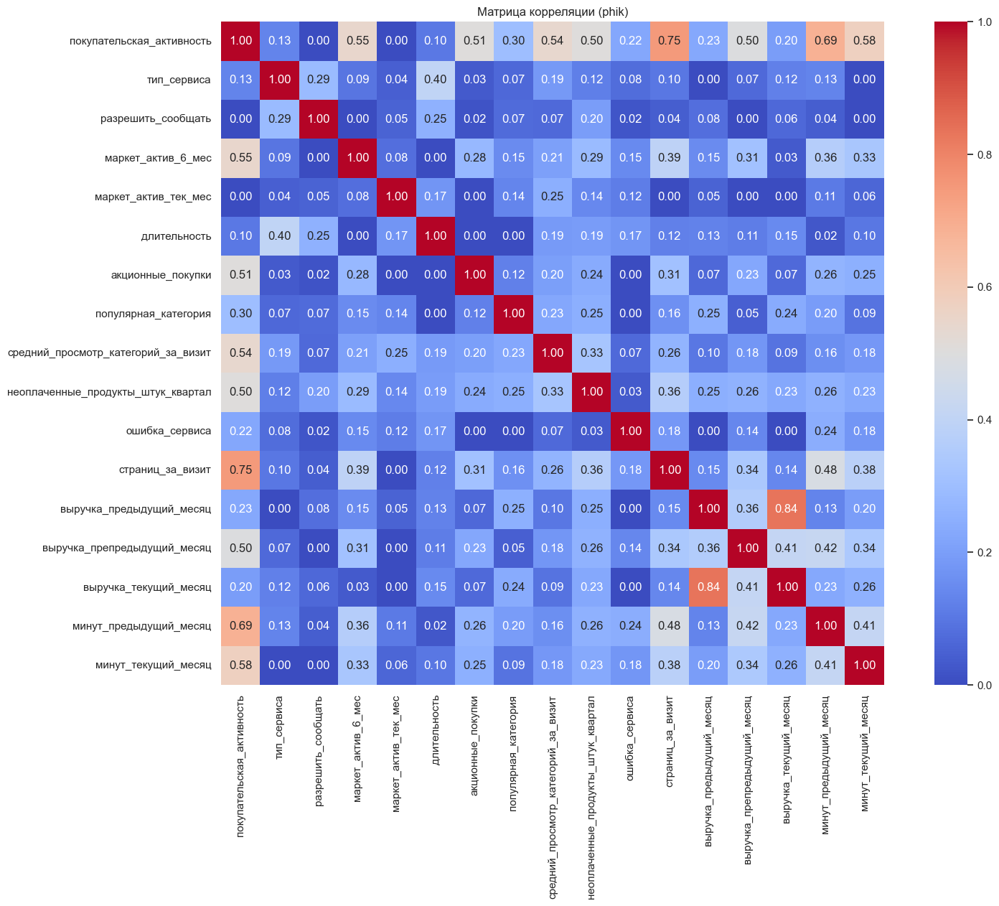

In [63]:
# проведем корреляционный анализ признаков
market_cor = market.drop(columns=['id'])
correlation_matrix = market_cor.phik_matrix()

# визуализируем
plt.figure(figsize=(18, 12))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Матрица корреляции (phik)')
plt.show()

# ЗЫ: знаю, что лучше писать руками признаки, но мне так нравится больше + я проверяю, чтобы все было нормально

In [64]:
# выведем корреляцию покупательской активности
corr = correlation_matrix['покупательская_активность'].sort_values(ascending=False)

display("Сильня корреляция с покупательская_активность:")
display(corr[corr >= 0.5])

display("Слабая корреляция с покупательская_активность:")
display(corr[corr < 0.5])

'Сильня корреляция с покупательская_активность:'

покупательская_активность             1.00
страниц_за_визит                      0.75
минут_предыдущий_месяц                0.69
минут_текущий_месяц                   0.58
маркет_актив_6_мес                    0.55
средний_просмотр_категорий_за_визит   0.54
акционные_покупки                     0.51
неоплаченные_продукты_штук_квартал    0.50
Name: покупательская_активность, dtype: float64

'Слабая корреляция с покупательская_активность:'

выручка_препредыдущий_месяц   0.50
популярная_категория          0.30
выручка_предыдущий_месяц      0.23
ошибка_сервиса                0.22
выручка_текущий_месяц         0.20
тип_сервиса                   0.13
длительность                  0.10
маркет_актив_тек_мес          0.00
разрешить_сообщать            0.00
Name: покупательская_активность, dtype: float64

In [65]:
# проверим зависимость VIF
X_test = market.drop(columns=['id', 'покупательская_активность'])

X_test = pd.get_dummies(X_test, drop_first=True)
X_test = X_test.assign(const=1)

for col in X_test.select_dtypes(include='bool').columns:
    X_test[col] = X_test[col].astype(int)

X_test = X_test.dropna()

# Пересчитываем VIF
vif_data = pd.DataFrame()
vif_data["Признаки"] = X_test.columns
vif_data["VIF"] = [variance_inflation_factor(X_test.values, i) for i in range(X_test.shape[1])]

# Удаляем константу из результатов
vif_data = vif_data[vif_data["Признаки"] != "const"]
display(vif_data)

,Признаки,VIF
0,маркет_актив_6_мес,1.23
1,маркет_актив_тек_мес,1.08
2,длительность,1.25
3,акционные_покупки,1.19
4,средний_просмотр_категорий_за_визит,1.24
5,неоплаченные_продукты_штук_квартал,1.27
6,ошибка_сервиса,1.09
7,страниц_за_визит,1.47
8,выручка_предыдущий_месяц,4.40
9,выручка_препредыдущий_месяц,1.63


### Выводы

Что бросается в глаза - это высокую коррелляцию маркетинговых активностей в пользу посещения сайта клиентом. Т.е. маркетинг работает, пусть и не так сильно как, наверное, хотелось бы. Ну и те, кто больше сидит на сайте - тоже в приоритете

Мультиколлинеарности не наблюдается.

Значение VIF выше 5 требует внимания, а выше 10 — серьезного рассмотрения изменений в модели, в нашем же случае, все до 5, поэтому спокойно идем дальше.

In [66]:
market.sample(2)

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц
419,215767,Прежний уровень,премиум,да,4.10,4,316,0.12,Товары для детей,2,3,4,6,4729.00,5282.00,4379.30,14.00,18.00
935,216283,Прежний уровень,стандарт,нет,5.70,5,471,0.19,Косметика и аксессуары,4,2,4,8,4700.50,4798.00,4746.00,16.00,10.00


In [67]:
active_normal = market[market['покупательская_активность'] == 'Прежний уровень']
active_bad = market[market['покупательская_активность'] == 'Снизилась']

In [68]:
target_1 = 'выручка_текущий_месяц'
target_2 = 'выручка_предыдущий_месяц'
display(format_display('Прежняя активность'))
plot_density_heatmap(active_normal, target_1, target_2)
display(format_display('Снизилась'))
plot_density_heatmap(active_bad, target_1, target_2)

Интересная зависимость - в целом начали тратить больше, в сравнении с прошлым месяцем.

In [69]:
target_1 = 'выручка_текущий_месяц'
target_2 = 'выручка_препредыдущий_месяц'
display(format_display('Прежняя активность'))
plot_density_heatmap(active_normal, target_1, target_2)
display(format_display('Снизилась'))
plot_density_heatmap(active_bad, target_1, target_2)

Логичная и наглядная линейная зависимость - кто принес хорошую выручку в прошлом месяце, в этом так же принесет хорошую

Можем дополнительно проверить маркетинговую активность, по логике она тоже должна работать

In [70]:
target_1 = 'выручка_текущий_месяц'
target_2 = 'маркет_актив_6_мес'
display(format_display('Прежняя активность'))
plot_density_heatmap(active_normal, target_1, target_2)
display(format_display('Снизилась'))
plot_density_heatmap(active_bad, target_1, target_2)

Но нет, зависимости здесь не наблюдается

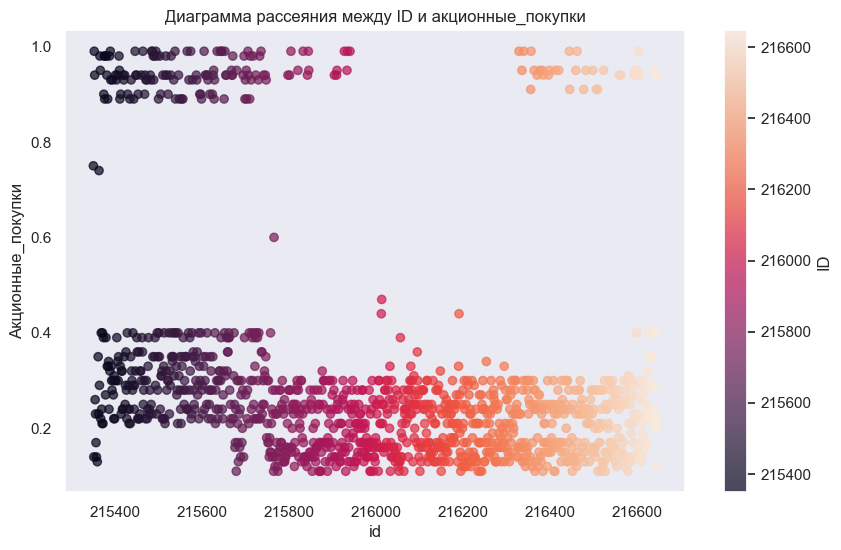

In [71]:
plt.figure(figsize=(10, 6))
plt.scatter(market['id'], market['акционные_покупки'], c=market['id'], alpha=0.7)
plt.colorbar(label='ID')
plt.title('Диаграмма рассеяния между ID и акционные_покупки')
plt.xlabel('id')
plt.ylabel('Акционные_покупки')
plt.grid()
plt.show()

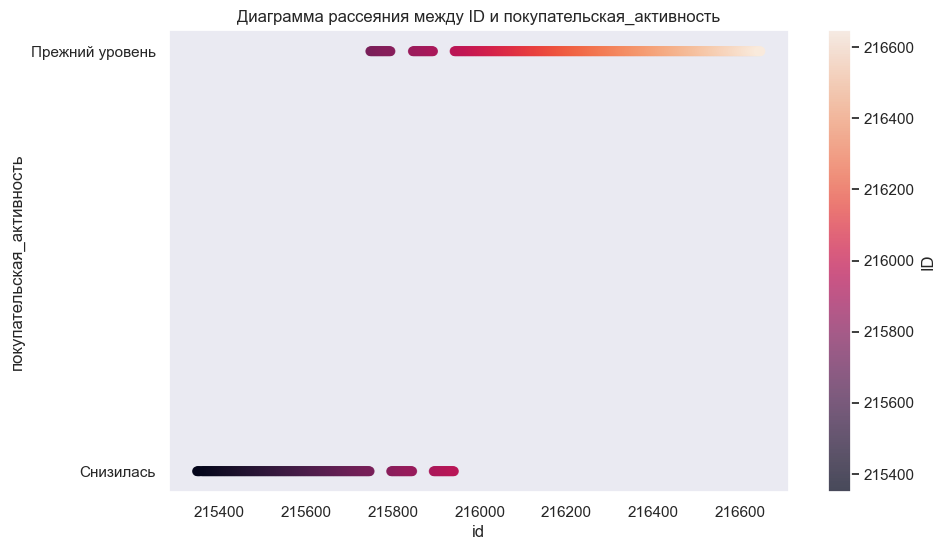

In [72]:
plt.figure(figsize=(10, 6))
plt.scatter(market['id'], market['покупательская_активность'], c=market['id'], alpha=0.7)
plt.colorbar(label='ID')
plt.title('Диаграмма рассеяния между ID и покупательская_активность')
plt.xlabel('id')
plt.ylabel('покупательская_активность')
plt.grid()
plt.show()

Вот еще одна интересная зависимость - покупательская активность падает у старичков, им уже мало чего надо.

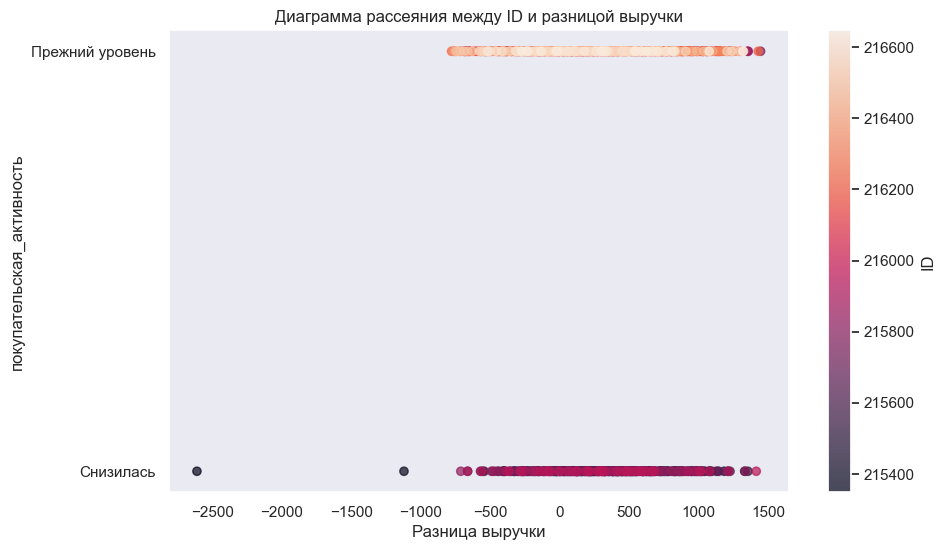

In [73]:
plt.figure(figsize=(10, 6))
plt.scatter((market['выручка_текущий_месяц'] - market['выручка_предыдущий_месяц']), market['покупательская_активность'], c=market['id'], alpha=0.7)
plt.colorbar(label='ID')
plt.title('Диаграмма рассеяния между ID и разницой выручки')
plt.xlabel('Разница выручки')
plt.ylabel('покупательская_активность')
plt.grid()
plt.show()

## Использование пайплайнов

### Подготовка данных

In [74]:
# сделаем таргет 0 / 1
# market['покупательская_активность'] = market['покупательская_активность'].apply(lambda x: 1 if x=='Снизилась' else 0)
# market['покупательская_активность'] = market['покупательская_активность'].astype(int) 

le = LabelEncoder()
market['покупательская_активность'] = le.fit_transform(market['покупательская_активность'])
display(market.sample(2))

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц
283,215631,1,стандарт,нет,4.60,5,345,0.28,Товары для детей,2,2,1,1,5020.50,4566.00,4802.10,6.00,7.00
287,215635,1,премиум,да,4.10,3,839,0.22,Домашний текстиль,4,1,5,6,5167.00,4900.00,5772.80,11.00,11.00


In [75]:
# и сделаем категорию покупок по акции
market['акционные_покупки_категория'] = market['акционные_покупки'].apply(lambda x: 'Часто' if x>= 0.5 else 'Редко')

In [76]:
market = market.set_index('id')

In [77]:
market.sample(3)

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,акционные_покупки_категория
id,,,,,,,,,,,,,,,,,,
215474,1,премиум,нет,3.50,4,690,0.24,Домашний текстиль,2,5,8,5,5470.50,4578.00,5521.20,11.00,13.00,Редко
215749,0,премиум,да,5.80,5,624,0.30,Техника для красоты и здоровья,4,3,6,14,5190.00,4928.00,5092.50,14.00,17.00,Редко
216585,0,стандарт,нет,5.90,3,134,0.25,Товары для детей,4,4,2,9,3853.00,4661.00,4683.70,16.00,16.00,Редко


In [78]:
# зафиксируем константы
RANDOM_STATE = 20
TEST_SIZE = 0.2

In [79]:
# разделим на выборки
X_train, X_test, y_train, y_test = train_test_split(
    market.drop(['покупательская_активность'], axis=1),
    market['покупательская_активность'],
    test_size = TEST_SIZE, 
    random_state = RANDOM_STATE,
    stratify = market['покупательская_активность'])

In [80]:
X_train.shape, X_test.shape

((1037, 17), (260, 17))

In [81]:
# создаём списки с названиями признаков
# ohe_columns
ohe_columns = get_ohe_columns(X_train)
ohe_columns.append('популярная_категория')

# ord_columns
ord_columns = get_ord_columns(X_train)
ord_columns.append('акционные_покупки_категория')
ord_columns.remove('популярная_категория')

# num_columns
num_columns = get_num_columns(X_train)
num_columns.remove('акционные_покупки')

In [82]:
display("Признаки для OHE:", ohe_columns)
display("Признаки для Ordinal:", ord_columns)
display("Количественные признаки:", num_columns)

'Признаки для OHE:'

['тип_сервиса',
 'разрешить_сообщать',
 'акционные_покупки_категория',
 'популярная_категория']

'Признаки для Ordinal:'

['акционные_покупки_категория']

'Количественные признаки:'

['маркет_актив_6_мес',
 'маркет_актив_тек_мес',
 'длительность',
 'средний_просмотр_категорий_за_визит',
 'неоплаченные_продукты_штук_квартал',
 'ошибка_сервиса',
 'страниц_за_визит',
 'выручка_предыдущий_месяц',
 'выручка_препредыдущий_месяц',
 'выручка_текущий_месяц',
 'минут_предыдущий_месяц',
 'минут_текущий_месяц']

### Подготовка пайплайна

In [83]:
# создаём пайплайн для подготовки признаков из списка ohe_columns: заполнение пропусков и OHE-кодирование
# SimpleImputer + OHE
ohe_pipe = Pipeline(
    [
        ('simpleImputer_ohe', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
        ('ohe', OneHotEncoder(drop='first', handle_unknown='error'))
    ]
)

In [84]:
# создаём пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование
# SimpleImputer + OE
ord_pipe = Pipeline(
    [
        ('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
        ('ord',  OrdinalEncoder(
                   categories=[
                       ['Редко','Часто'],
                   ], 
                   handle_unknown='use_encoded_value', unknown_value=np.nan
               )
           ),
        ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
    ]
)

In [85]:
# num_pipeline = Pipeline(steps=[
#     ('simpleImputer', SimpleImputer(strategy='mean')),
#     ('scaler', MinMaxScaler())
# ])

In [86]:
num_pipeline = ColumnTransformer(
    transformers=[
        ('minmax', Pipeline(steps=[
            ('simpleImputer', SimpleImputer(strategy='mean')),
            ('scaler', MinMaxScaler())
        ]), num_columns),

        ('standard', Pipeline(steps=[
            ('simpleImputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler())
        ]), num_columns),

        ('robust', Pipeline(steps=[
            ('simpleImputer', SimpleImputer(strategy='mean')),
            ('scaler', RobustScaler())
        ]), num_columns)
    ]
)

In [87]:
# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [('ohe', ohe_pipe, ohe_columns),
     ('ord', ord_pipe, ord_columns),
     ('num', num_pipeline, num_columns)
    ], 
    remainder='passthrough'
)

In [88]:
for name, transformer, columns in data_preprocessor.transformers:
    display(f"Transformer: {name}")
    display(f"Columns: {columns}")
    display(f"Pipeline: {transformer}")

'Transformer: ohe'

"Columns: ['тип_сервиса', 'разрешить_сообщать', 'акционные_покупки_категория', 'популярная_категория']"

"Pipeline: Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')),\n                ('ohe', OneHotEncoder(drop='first'))])"

'Transformer: ord'

"Columns: ['акционные_покупки_категория']"

"Pipeline: Pipeline(steps=[('simpleImputer_before_ord',\n                 SimpleImputer(strategy='most_frequent')),\n                ('ord',\n                 OrdinalEncoder(categories=[['Редко', 'Часто']],\n                                handle_unknown='use_encoded_value',\n                                unknown_value=nan)),\n                ('simpleImputer_after_ord',\n                 SimpleImputer(strategy='most_frequent'))])"

'Transformer: num'

"Columns: ['маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность', 'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', 'страниц_за_визит', 'выручка_предыдущий_месяц', 'выручка_препредыдущий_месяц', 'выручка_текущий_месяц', 'минут_предыдущий_месяц', 'минут_текущий_месяц']"

"Pipeline: ColumnTransformer(transformers=[('minmax',\n                                 Pipeline(steps=[('simpleImputer',\n                                                  SimpleImputer()),\n                                                 ('scaler', MinMaxScaler())]),\n                                 ['маркет_актив_6_мес', 'маркет_актив_тек_мес',\n                                  'длительность',\n                                  'средний_просмотр_категорий_за_визит',\n                                  'неоплаченные_продукты_штук_квартал',\n                                  'ошибка_сервиса', 'страниц_за_визит',\n                                  'выручка_предыдущий_месяц',\n                                  'выручка_препредыдущий_месяц',\n                                  'в...\n                                 Pipeline(steps=[('simpleImputer',\n                                                  SimpleImputer()),\n                                                 ('scaler', RobustSca

In [89]:
scoring_metrics = {
    'roc_auc': 'roc_auc',
    'accuracy': 'accuracy',
    'f1': 'f1'
}

### Обучение моделей

In [90]:
optuna.logging.set_verbosity(optuna.logging.ERROR)
CLASS_WEIGHT = 'balanced'
WEIGHTS_FOR_KNEIGHBORS = 'distance'

result = []
used_params = set()  # Множество для хранения использованных параметров

def objective(trial):
    model_choice = trial.suggest_categorical('model', ['DecisionTree', 'KNeighbors', 'LogisticRegression', 'SVC'])
    
    if model_choice == 'DecisionTree':
        max_depth = trial.suggest_int('max_depth', 2, 15)
        max_features = trial.suggest_int('max_features', 2, 15)
        min_samples_split = trial.suggest_int('min_samples_split', 2, 15)
        params_tuple = (model_choice, max_depth, max_features, min_samples_split)
    
    elif model_choice == 'KNeighbors':
        n_neighbors = trial.suggest_int('n_neighbors', 2, 50)
        params_tuple = (model_choice, n_neighbors)
    
    elif model_choice == 'LogisticRegression':
        C = trial.suggest_float('C', 0.01, 1000.0, log=True)
        penalty = trial.suggest_categorical('penalty', ['l1', 'l2'])
        params_tuple = (model_choice, C, penalty)
    
    elif model_choice == 'SVC':
        degree = trial.suggest_int('degree', 2, 15)
        C = trial.suggest_float('C', 0.01, 1000.0, log=True)
        gamma = trial.suggest_categorical('gamma', ['scale', 'auto'])
        params_tuple = (model_choice, degree, C, gamma)

    if params_tuple in used_params:
        return 0
    used_params.add(params_tuple)

    if model_choice == 'DecisionTree':
        model = DecisionTreeClassifier(max_depth=max_depth,
                                       max_features=max_features, 
                                       min_samples_split=min_samples_split,
                                       random_state=RANDOM_STATE,
                                       class_weight=CLASS_WEIGHT)
    
    elif model_choice == 'KNeighbors':
        model = KNeighborsClassifier(n_neighbors=n_neighbors,
                                    weights=WEIGHTS_FOR_KNEIGHBORS)
    
    elif model_choice == 'LogisticRegression':
        model = LogisticRegression(C=C,
                                   random_state=RANDOM_STATE,
                                   solver='liblinear',
                                   penalty=penalty,
                                   class_weight=CLASS_WEIGHT)
    
    elif model_choice == 'SVC':
        model = SVC(degree=degree,
                    C=C,
                    gamma=gamma,
                    random_state=RANDOM_STATE, 
                    probability=True,
                    class_weight=CLASS_WEIGHT)

    pipe_final = Pipeline([
        ('preprocessor', data_preprocessor),
        ('models', model)
    ])
    
    scoring_metric = trial.suggest_categorical('scoring_metric', ['roc_auc', 'accuracy', 'f1'])
    scores = cross_val_score(pipe_final, X_train, y_train, cv=5, scoring=scoring_metric)
    mean_score = scores.mean()
    
    pipe_final.fit(X_train, y_train)
    y_pred = pipe_final.predict(X_test)
    
    if scoring_metric == 'roc_auc':
        test_score = roc_auc_score(y_test, y_pred)
    elif scoring_metric == 'accuracy':
        test_score = accuracy_score(y_test, y_pred)
    elif scoring_metric == 'f1':
        test_score = f1_score(y_test, y_pred)

    result.append({
        'model': model_choice,
        'pipeline': pipe_final,
        'max_depth': trial.params.get('max_depth', None),
        'max_features': trial.params.get('max_features', None),
        'min_samples_split': trial.params.get('min_samples_split', None),
        'n_neighbors': trial.params.get('n_neighbors', None),
        'C': trial.params.get('C', None),
        'degree': trial.params.get('degree', None),
        'gamma': trial.params.get('gamma', None),
        'scoring_metric_train': mean_score,
        'scoring_metric_test': test_score
    })

    return mean_score

study = optuna.create_study(direction='maximize')

n = 50  # 50
for _ in tqdm(range(n), desc="Trials"):
    study.optimize(objective, n_trials=n)

best_params = study.best_params
best_metrics = result[study.best_trial.number]

final_output = {**best_params, **best_metrics}


Trials: 100%|██████████████████████████████████████████████████████████████████████████| 50/50 [02:09<00:00,  2.59s/it]


### Лушая модель и параметры

In [91]:
# display(final_output)
best_params_df = pd.DataFrame(list(final_output.items()), columns=['Параметры', 'Значение'])
display(format_display("Лучшая модель и параметры"))
filtered_df = best_params_df[best_params_df['Значение'].notna()]
display(filtered_df)

,Параметры,Значение
0,model,LogisticRegression
2,scoring_metric,roc_auc
3,pipeline,"(ColumnTransformer(remainder='passthrough',\n ..."
7,C,48.45
10,scoring_metric_train,0.86
11,scoring_metric_test,0.85


### Выводы

Обучение закончилось с характеристиками указанными выше.  
Для оценки был выбран roc_auc - т.к. у нас классы не сбалансированы, а эта метрика даст более точную оценку модели и ее работы.  
Получился довольно неплохая модель с хорошими результатами.  

## Анализ важности признаков

### Графики

In [92]:
# display(result)

result_df = pd.DataFrame(result)
result_df = result_df.sort_values(by=['scoring_metric_train', 'scoring_metric_test'], ascending=False)
display(result_df.head(10))
display(result_df.info())

,model,pipeline,max_depth,max_features,min_samples_split,n_neighbors,C,degree,gamma,scoring_metric_train,scoring_metric_test
25,KNeighbors,"(ColumnTransformer(remainder='passthrough',\n ...",NaN,NaN,NaN,50.00,NaN,NaN,None,0.93,0.86
38,KNeighbors,"(ColumnTransformer(remainder='passthrough',\n ...",NaN,NaN,NaN,42.00,NaN,NaN,None,0.93,0.85
24,KNeighbors,"(ColumnTransformer(remainder='passthrough',\n ...",NaN,NaN,NaN,48.00,NaN,NaN,None,0.93,0.86
30,KNeighbors,"(ColumnTransformer(remainder='passthrough',\n ...",NaN,NaN,NaN,45.00,NaN,NaN,None,0.93,0.86
22,KNeighbors,"(ColumnTransformer(remainder='passthrough',\n ...",NaN,NaN,NaN,44.00,NaN,NaN,None,0.93,0.86
33,KNeighbors,"(ColumnTransformer(remainder='passthrough',\n ...",NaN,NaN,NaN,47.00,NaN,NaN,None,0.93,0.86
23,KNeighbors,"(ColumnTransformer(remainder='passthrough',\n ...",NaN,NaN,NaN,46.00,NaN,NaN,None,0.93,0.86
61,KNeighbors,"(ColumnTransformer(remainder='passthrough',\n ...",NaN,NaN,NaN,35.00,NaN,NaN,None,0.93,0.85
65,KNeighbors,"(ColumnTransformer(remainder='passthrough',\n ...",NaN,NaN,NaN,27.00,NaN,NaN,None,0.93,0.86
41,KNeighbors,"(ColumnTransformer(remainder='passthrough',\n ...",NaN,NaN,NaN,39.00,NaN,NaN,None,0.93,0.85


<class 'pandas.core.frame.DataFrame'>
Index: 367 entries, 25 to 325
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   model                 367 non-null    object 
 1   pipeline              367 non-null    object 
 2   max_depth             104 non-null    float64
 3   max_features          104 non-null    float64
 4   min_samples_split     104 non-null    float64
 5   n_neighbors           49 non-null     float64
 6   C                     214 non-null    float64
 7   degree                107 non-null    float64
 8   gamma                 107 non-null    object 
 9   scoring_metric_train  367 non-null    float64
 10  scoring_metric_test   367 non-null    float64
dtypes: float64(8), object(3)
memory usage: 34.4+ KB


None

In [93]:
model_name = best_params['model']

if model_name == 'SVC':
    model = SVC(
        degree=best_params['degree'],
        C=best_params['C'],
        gamma=best_params['gamma'],
        probability=True,
        random_state=RANDOM_STATE
    )
elif model_name == 'KNeighbors':
    model = KNeighborsClassifier(
        n_neighbors=best_params['n_neighbors']
    )
elif model_name == 'LogisticRegression':
    model = LogisticRegression(
        C=best_params['C'],
        solver='liblinear',
        penalty='l1',
        random_state=RANDOM_STATE
    )
elif model_name == 'DecisionTree':
    model = DecisionTreeClassifier(
        max_depth=best_params['max_depth'],
        max_features=best_params['max_features'],
        min_samples_split=best_params['min_samples_split'],
        random_state=RANDOM_STATE
    )

pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', model)
])
    
X_train_new = pipe_final.named_steps['preprocessor'].fit_transform(X_train)
feature_names = pipe_final.named_steps['preprocessor'].get_feature_names_out()
X_train_new = pd.DataFrame(X_train_new, columns=feature_names)

model.fit(X_train_new, y_train)

K = 5
background_data = shap.sample(X_train_new, K)

if model_name == 'SVC':
    explainer = shap.KernelExplainer(model.decision_function, background_data)
elif model_name == 'KNeighbors':
    explainer = shap.KernelExplainer(model.predict_proba, background_data)
elif model_name == 'LogisticRegression':
    explainer = shap.LinearExplainer(model, background_data)
elif model_name == 'DecisionTree':
    explainer = shap.TreeExplainer(model)

X_test_new = pipe_final.named_steps['preprocessor'].transform(X_test)
X_test_new = pd.DataFrame(X_test_new, columns=feature_names)

shap_values = explainer(X_test_new)

  0%|          | 0/260 [00:00<?, ?it/s]

In [94]:
display(X_test_new.shape)
display(shap_values.shape)
if X_test_new.shape != shap_values.shape:
    shap_values = shap_values[:, :, 1]

(260, 46)

(260, 46, 2)

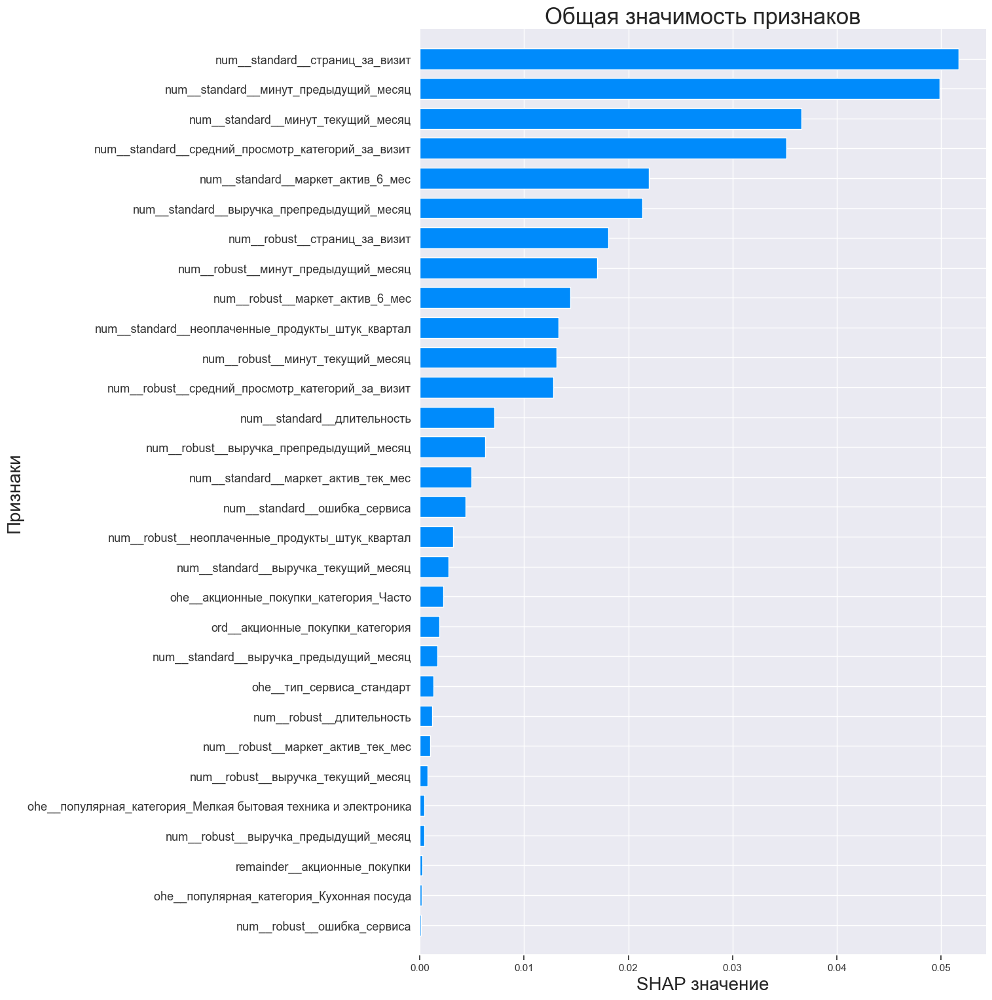

In [95]:
# Первый график
shap.summary_plot(
    shap_values, 
    X_test_new, 
    plot_type="bar",
    max_display=30, 
    plot_size=(15, 15),
    show=False
)

plt.title('Общая значимость признаков', fontsize=25)
plt.xlabel('SHAP значение', fontsize=20)
plt.ylabel('Признаки', fontsize=20)
plt.show()

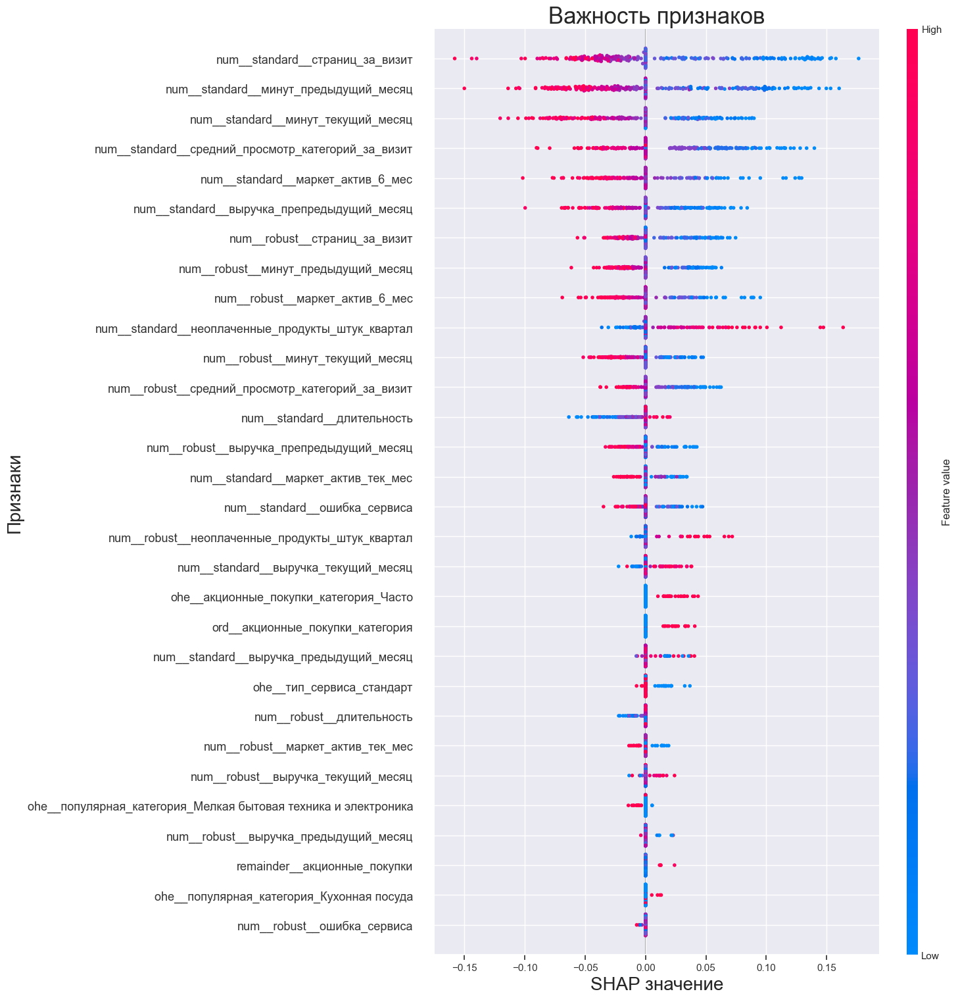

In [96]:
# Второй график
shap.summary_plot(
    shap_values, 
    X_test_new, 
    plot_type="dot", 
    max_display=30, 
    plot_size=(15, 15),
    show=False
)

plt.title('Важность признаков', fontsize=25)
plt.xlabel('SHAP значение', fontsize=20)
plt.ylabel('Признаки', fontsize=20)
plt.show()

### Выводы

In [97]:
if X_test_new.shape != shap_values.shape:
    shap_values = explainer(X_test_new)

shap_values_array = shap_values.values
shap_values_mean = np.abs(shap_values_array).mean(axis=0)

# создаем DataFrame для удобства
feature_importance = pd.DataFrame({
    'Признак': X_test_new.columns,
    'SHAP значение': shap_values_mean
})

top_features = feature_importance.sort_values(by='SHAP значение', ascending=False).head(10)

display(format_display("Для модели наиболее важны следующие признаки:"))
display(top_features)

,Признак,SHAP значение
27,num__standard__страниц_за_визит,0.05
31,num__standard__минут_предыдущий_месяц,0.05
32,num__standard__минут_текущий_месяц,0.04
24,num__standard__средний_просмотр_категорий_за_в...,0.04
21,num__standard__маркет_актив_6_мес,0.02
29,num__standard__выручка_препредыдущий_месяц,0.02
39,num__robust__страниц_за_визит,0.02
43,num__robust__минут_предыдущий_месяц,0.02
33,num__robust__маркет_актив_6_мес,0.01
25,num__standard__неоплаченные_продукты_штук_квартал,0.01


Общий вывод:  
1) remainder__акционные_покупки - более высокие значения этого признака с точки зрения модели увеличивают вероятность снижения покупательской активности;  
2) num__средний_просмотр_категорий_за_визит, num__страниц_за_визит, num__минут_текущий_месяц, num__маркет_актив_6_мес - Более высокие значения этого признака с точки зрения модели увеличивают вероятность сохранения покупательской активности;  

Признаки, которые положительно влияют на сохранение покупательской активности, важны для поддержания интереса покупателей. Другие признаки указывают на факторы, которые могут привести к снижению активности, и их следует учитывать для улучшения бизнес-стратегий.

## Сегментация покупателей

### Используйте результаты моделирования и данные о прибыльности покупателей

In [98]:
# подготовим вероятности снижения покупательской активности
y_test_proba = model.predict_proba(X_test_new)[:, 1]
y_train_proba = model.predict_proba(X_train_new)[:, 1]

In [99]:
# заполним данные в общую базу
X_test['вероятность_снижения'] = y_test_proba
X_train['вероятность_снижения'] = y_train_proba
market = pd.concat([X_test, X_train])

In [100]:
market.sample(2)

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,акционные_покупки_категория,вероятность_снижения
id,,,,,,,,,,,,,,,,,,
216365,премиум,да,4.40,5,597,0.24,Товары для детей,3,5,4,15,4376.00,4767.00,4845.30,17.00,16.00,Редко,0.12
215680,премиум,да,4.40,4,844,0.30,Товары для детей,1,5,3,15,4853.00,4859.00,4977.80,11.00,12.00,Редко,0.30


In [101]:
# и еще у нас осталась неиспользованная база money
money = money.set_index('id')
market = market.join(money)
market.sample(2)

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,акционные_покупки_категория,вероятность_снижения,прибыль
id,,,,,,,,,,,,,,,,,,,
216599,стандарт,да,3.30,4,453,0.22,Техника для красоты и здоровья,2,5,8,8,4408.50,4428.00,4521.60,12.00,9.00,Редко,0.68,4060.00
215856,стандарт,да,4.30,4,543,0.17,Техника для красоты и здоровья,6,3,5,11,3652.00,4376.00,4409.90,13.00,20.00,Редко,0.06,3140.00


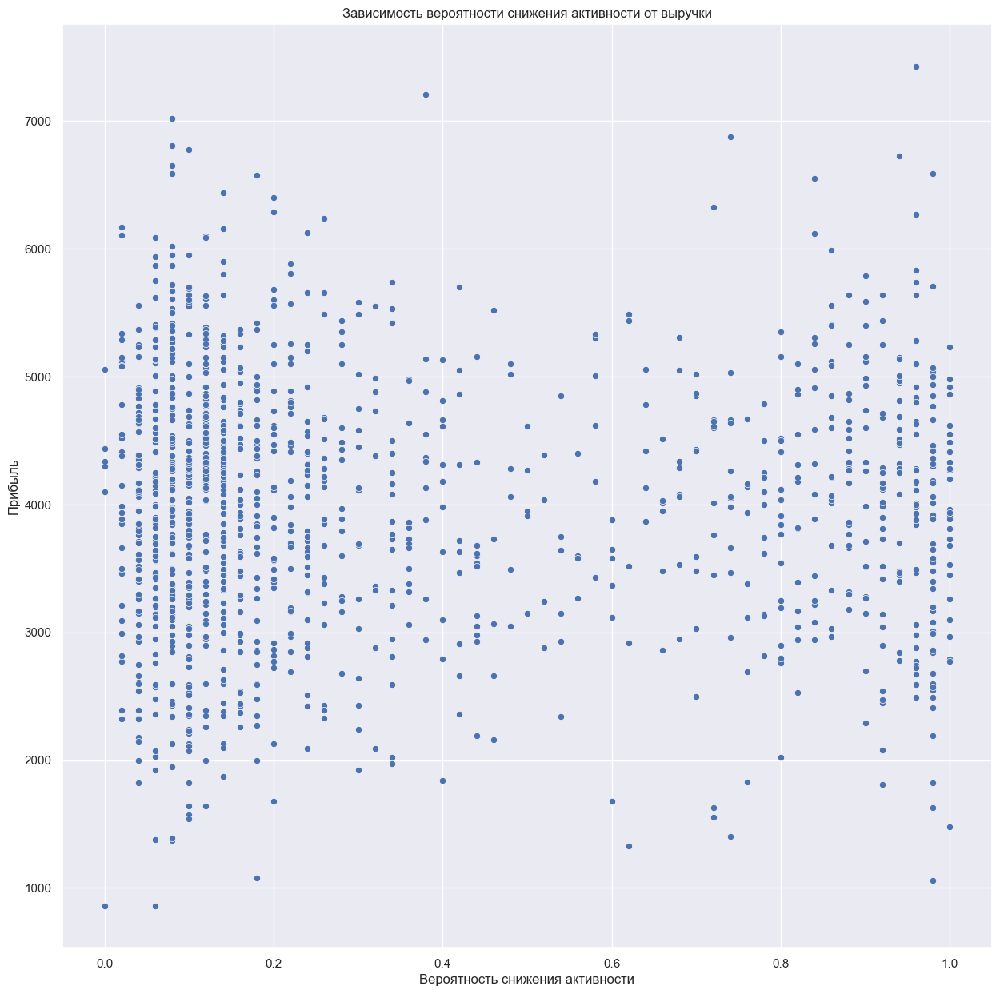

In [102]:
fig = plt.figure(figsize=(15,15))
sns.scatterplot(data=market, y='прибыль', x='вероятность_снижения')
plt.xlabel('Вероятность снижения активности')
plt.ylabel('Прибыль')
plt.title('Зависимость вероятности снижения активности от выручки')
plt.show()

На диарграмме рассеянья зависимости снижения активности от прибыли не наблюдается

### Выберите группу покупателей и предложите, как увеличить её покупательскую активность

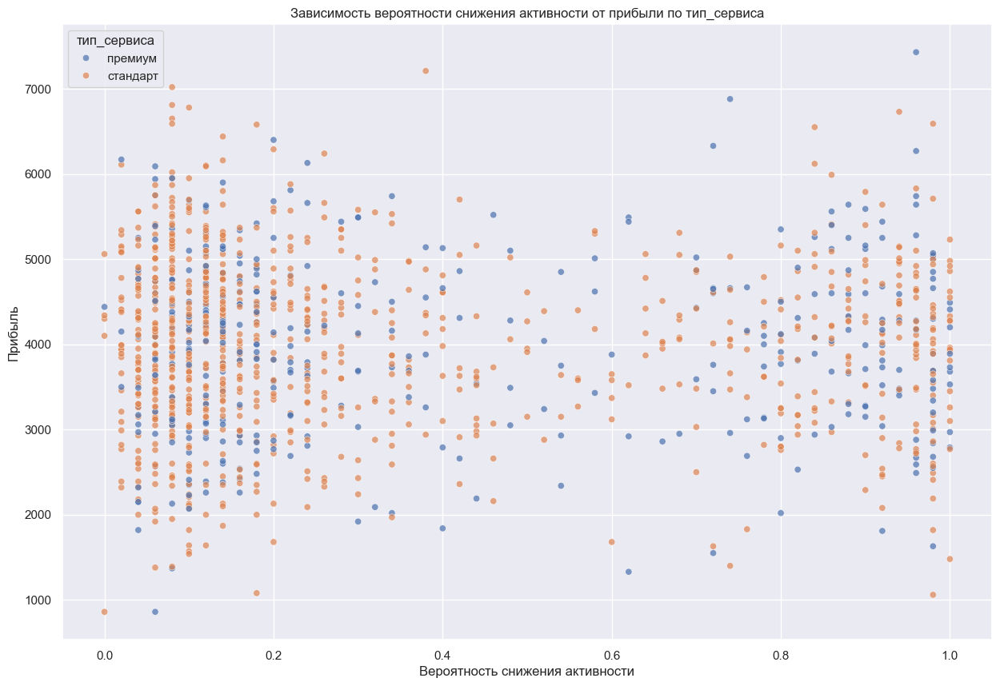

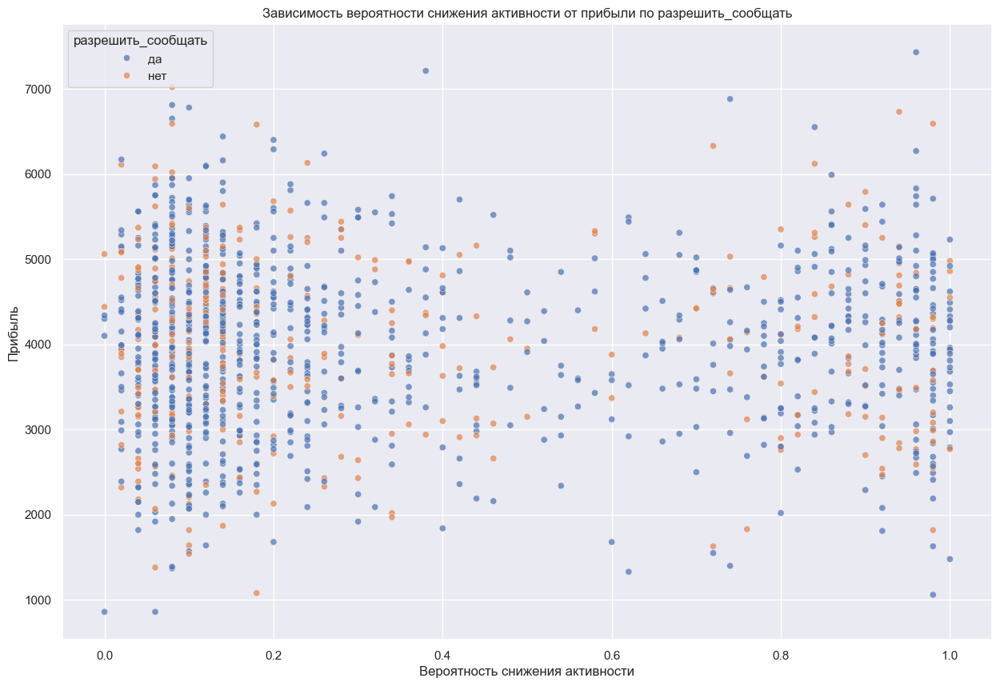

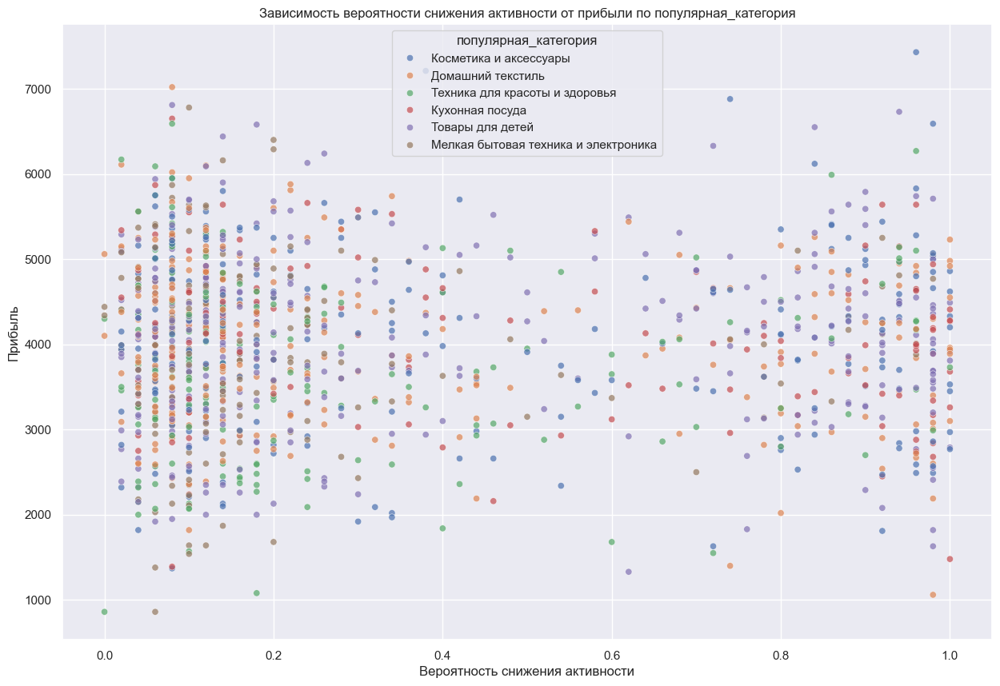

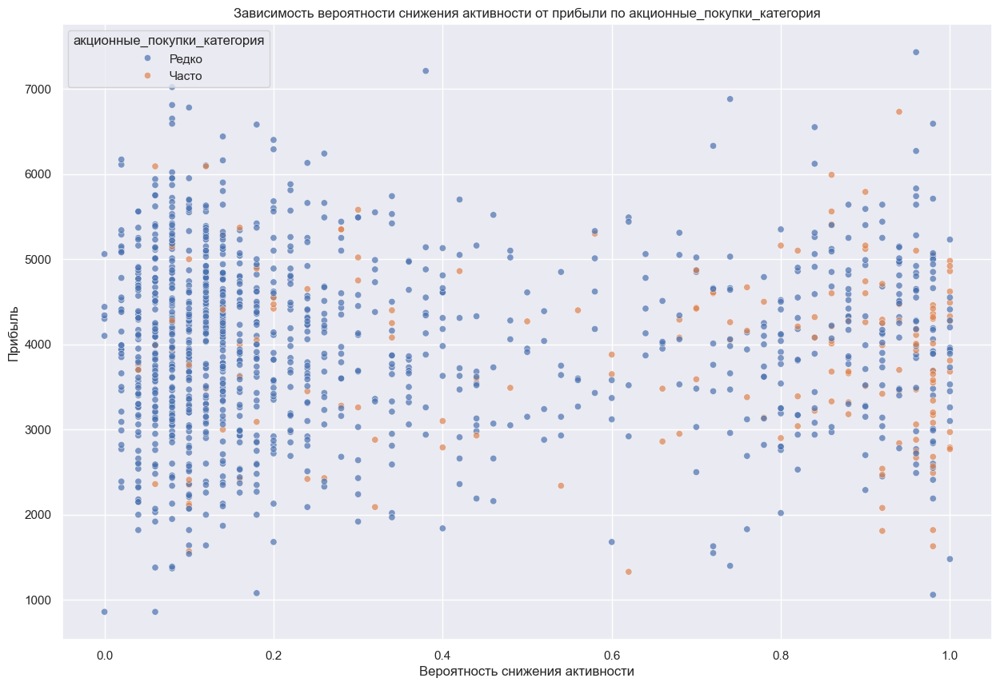

In [103]:
plot_scatter_with_categories(market)

Из представленных выше графиков - выделяется только акционный.  
Т.е. те, кто чаще покупают по акции, у тех падает покупательская активность.  
Как следствие - можно чаще вводить акции/скидки, пусть и не на значительные показатели.

### Сделайте выводы о сегментах

Сделаем дополнительный оценочный сегмент покупателей  
Будем смотреть тех, кто часто покупает по акции и тех, у кого вероятность спада покупательского потенциала выше, например 0.75

In [104]:
market['сегмент'] = market.apply( lambda row: 'Таргет' if row['вероятность_снижения'] > 0.75 \
    and row['акционные_покупки_категория']=='Часто' else 'Другие', axis=1)

In [105]:
market.head()

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,акционные_покупки_категория,вероятность_снижения,прибыль,сегмент
id,,,,,,,,,,,,,,,,,,,,
215619,премиум,да,4.80,3,789,0.28,Косметика и аксессуары,2,4,3,3,4889.50,4624.00,5543.40,10.00,12.00,Редко,0.86,5120.00,Другие
215947,премиум,да,3.50,4,436,0.19,Домашний текстиль,5,2,1,19,4860.00,5193.00,4701.40,14.00,13.00,Редко,0.12,4460.00,Другие
216308,премиум,да,4.70,4,974,0.24,Техника для красоты и здоровья,1,2,0,14,4991.00,5018.00,5144.40,15.00,16.00,Редко,0.14,4130.00,Другие
215536,стандарт,нет,3.80,3,898,0.40,Кухонная посуда,3,6,2,5,6378.50,4952.00,7467.90,15.00,12.00,Редко,0.64,4130.00,Другие
215668,премиум,да,4.40,4,343,0.94,Товары для детей,2,9,2,2,5567.50,4723.00,5293.20,6.00,9.00,Часто,1.00,4490.00,Таргет


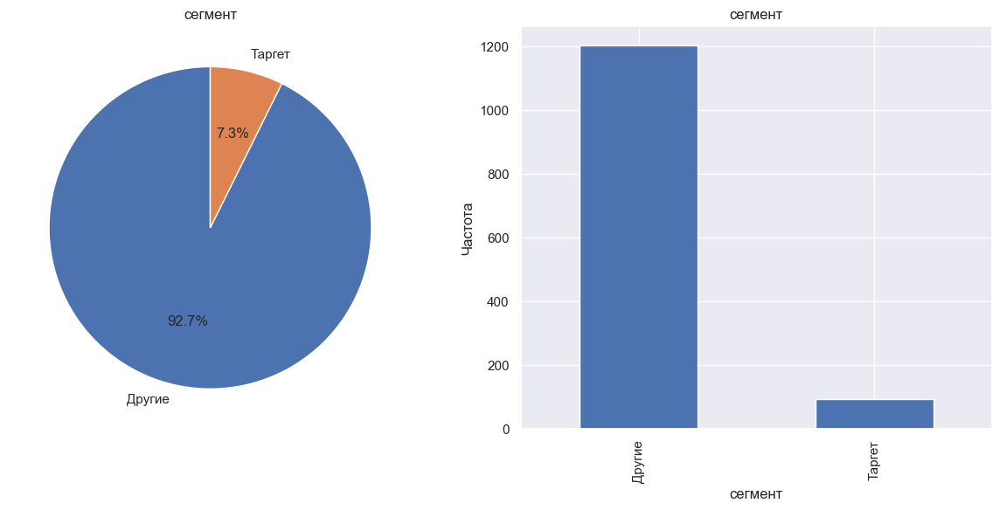

In [106]:
plot_categorical_columns(market[['сегмент']])

Оказывается, не так и много у нас потенциальных клиентов на снижение покупательской активности

In [107]:
# Фильтруем данные
filtered_data = market[market['сегмент'] == 'Таргет']

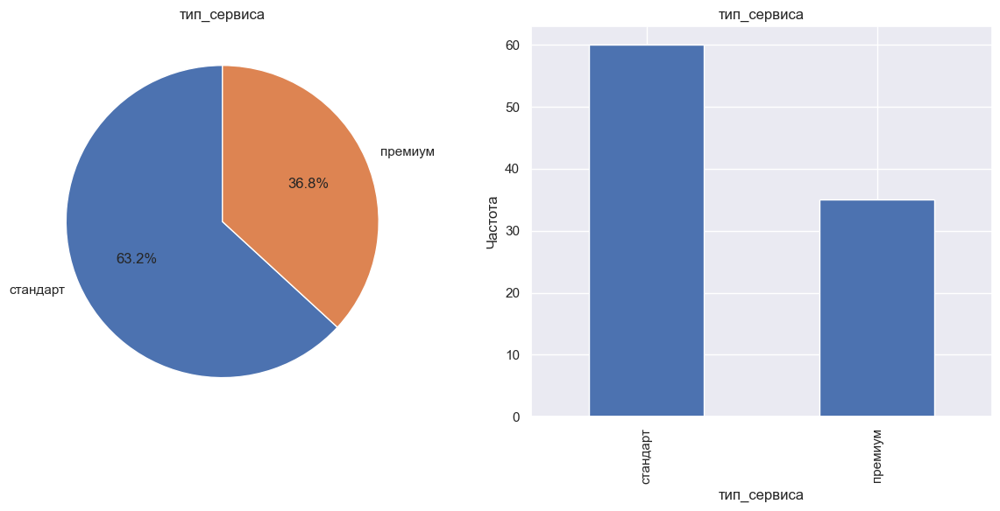

In [108]:
plot_categorical_columns(filtered_data, 'тип_сервиса')

Ожидаемо, со стандартным типом больше целевых клиентов, люди экономят

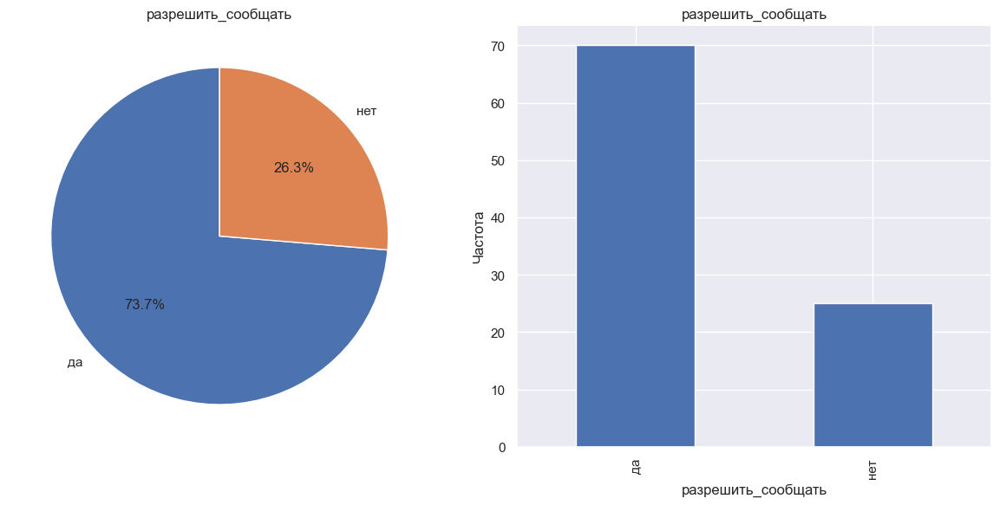

In [109]:
plot_categorical_columns(filtered_data, 'разрешить_сообщать')

Аналогично и тех, кто разрешает уведомления

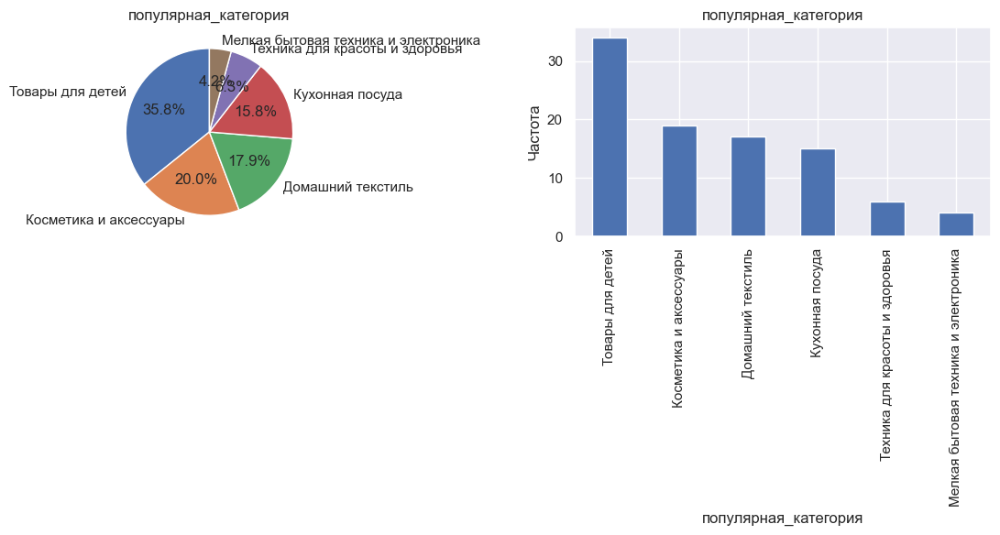

In [110]:
plot_categorical_columns(filtered_data, 'популярная_категория')

Ага! Вот оно - дети цветы жизни и дикий источник расходов, поэтому и покупательская способность падает...

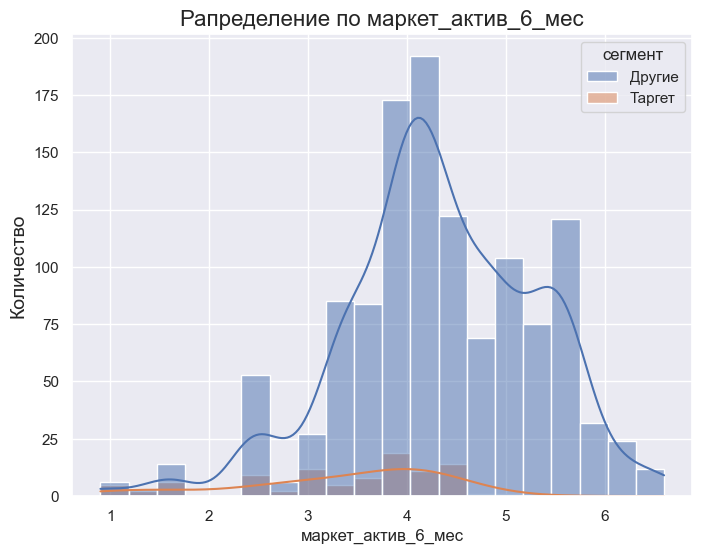

In [111]:
histogram(market, 'маркет_актив_6_мес', 'сегмент')

Маркетинг на таргет не очень-то и влияет

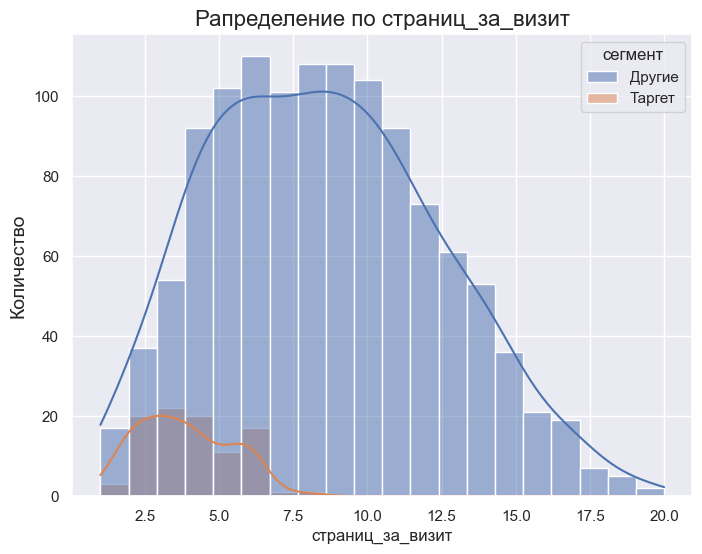

In [112]:
histogram(market, 'страниц_за_визит', 'сегмент')

У таргета нет цели полазать по сайту и поискать, что-то интересное, люди приходят за чем-то конкретным

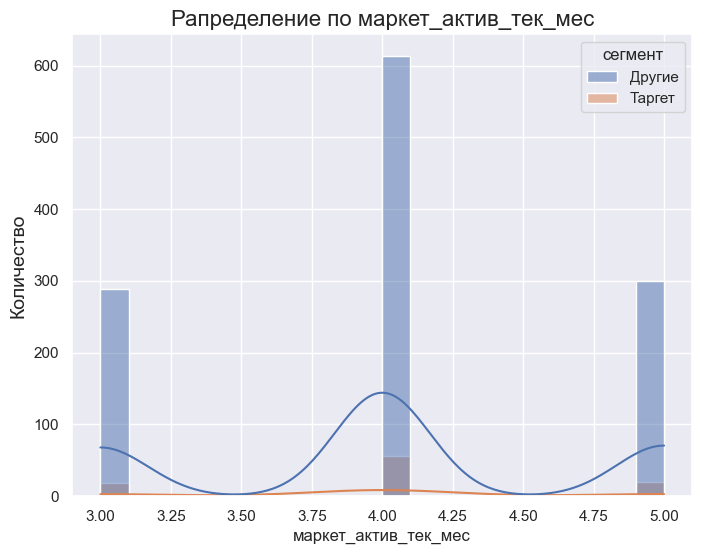

In [113]:
histogram(market, 'маркет_актив_тек_мес', 'сегмент')

Маркетинг на таргет не очень-то и влияет, ни за полгода, ни за месяц

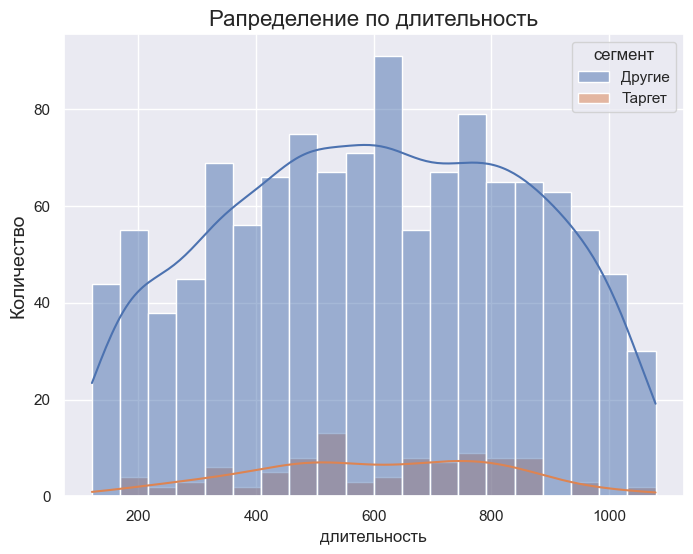

In [114]:
histogram(market, 'длительность', 'сегмент')

На сайте они также не задерживаются

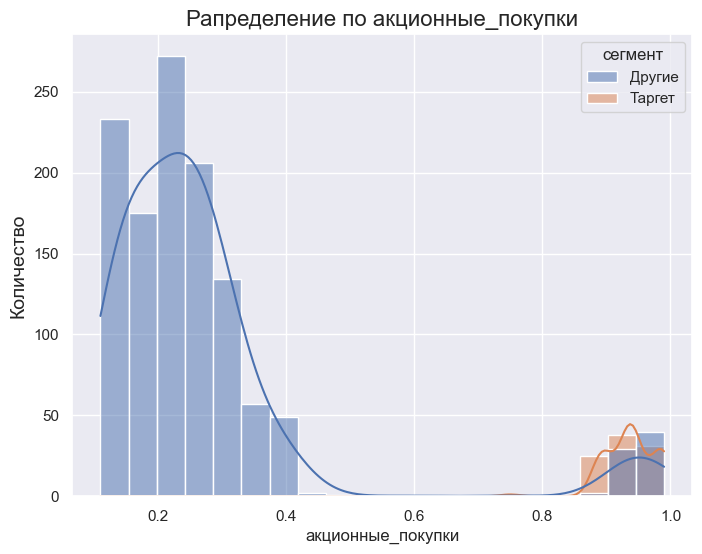

In [115]:
histogram(market, 'акционные_покупки', 'сегмент')

Ну тут все понятно, только акции, только хардкор  
Далее выводов под каждым графиком не будет, сделаю общий в конце

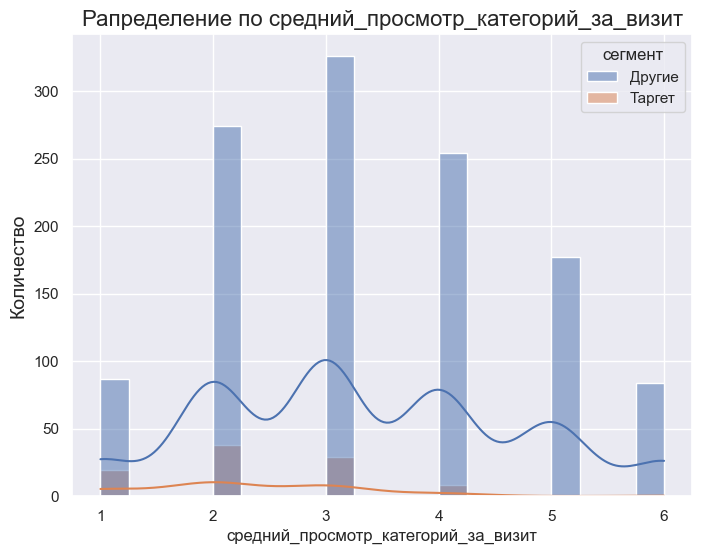

In [116]:
histogram(market, 'средний_просмотр_категорий_за_визит', 'сегмент')

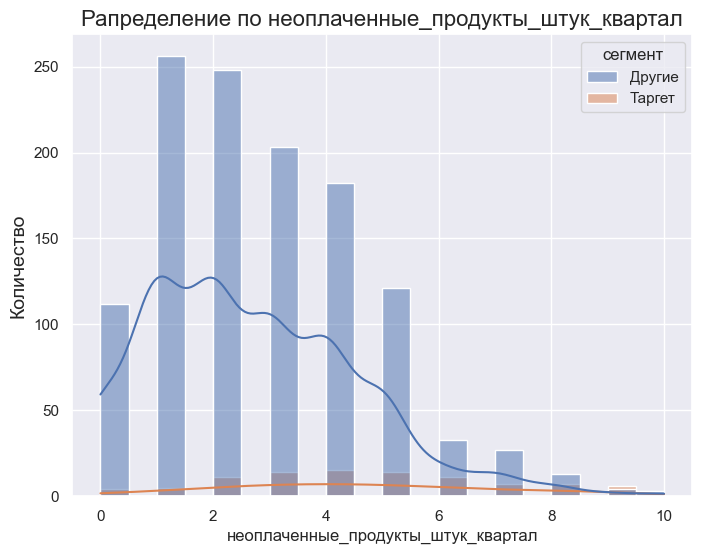

In [117]:
histogram(market, 'неоплаченные_продукты_штук_квартал', 'сегмент')

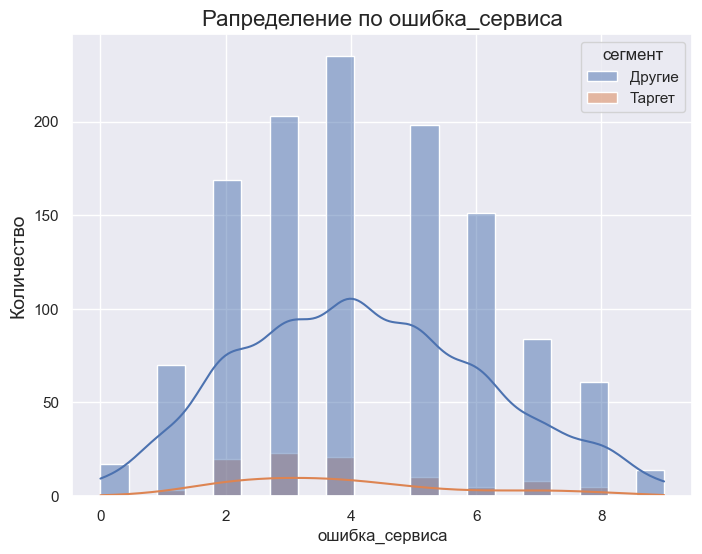

In [118]:
histogram(market, 'ошибка_сервиса', 'сегмент')

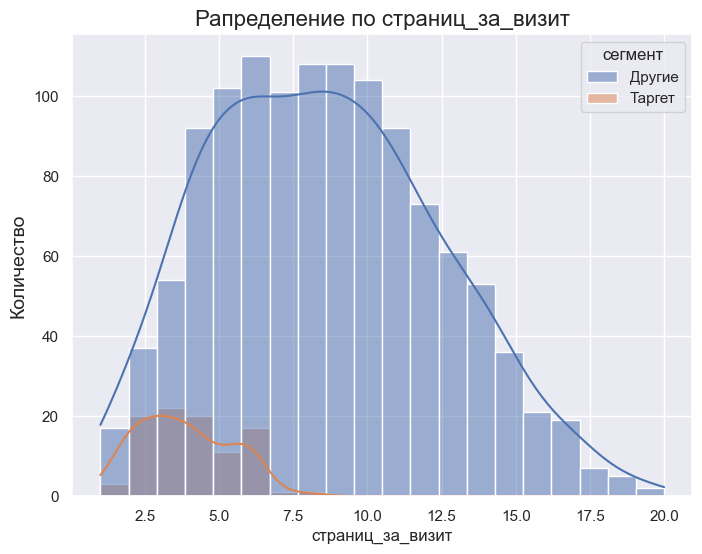

In [119]:
histogram(market, 'страниц_за_визит', 'сегмент')

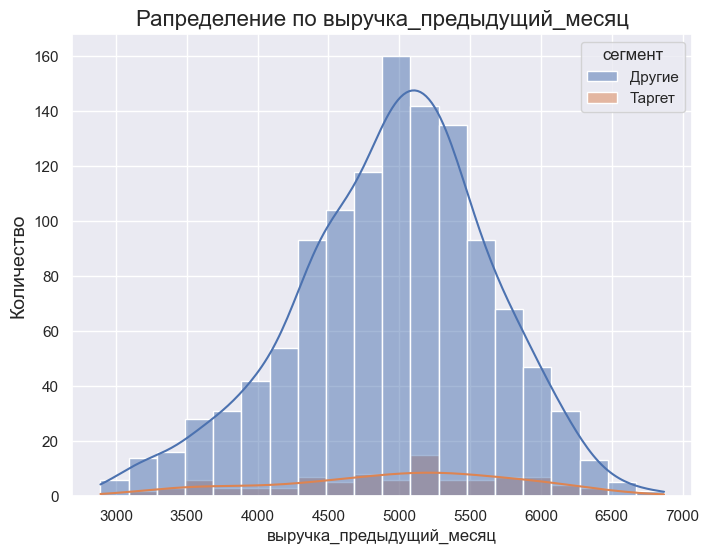

In [120]:
histogram(market, 'выручка_предыдущий_месяц', 'сегмент')

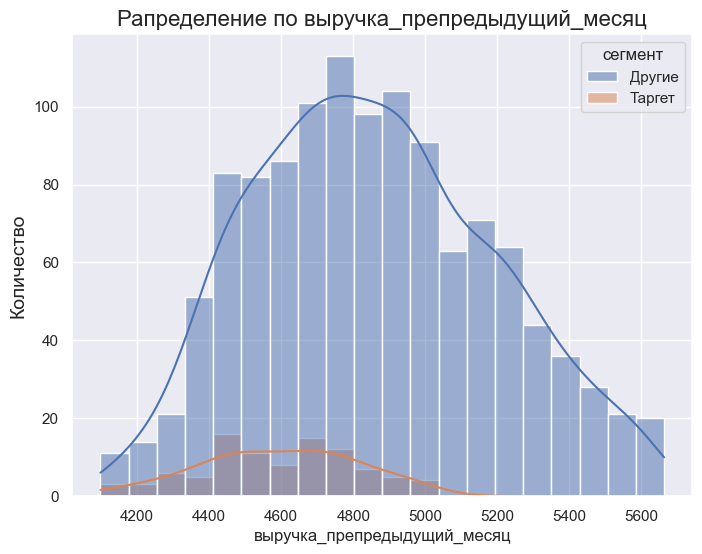

In [121]:
histogram(market, 'выручка_препредыдущий_месяц', 'сегмент')

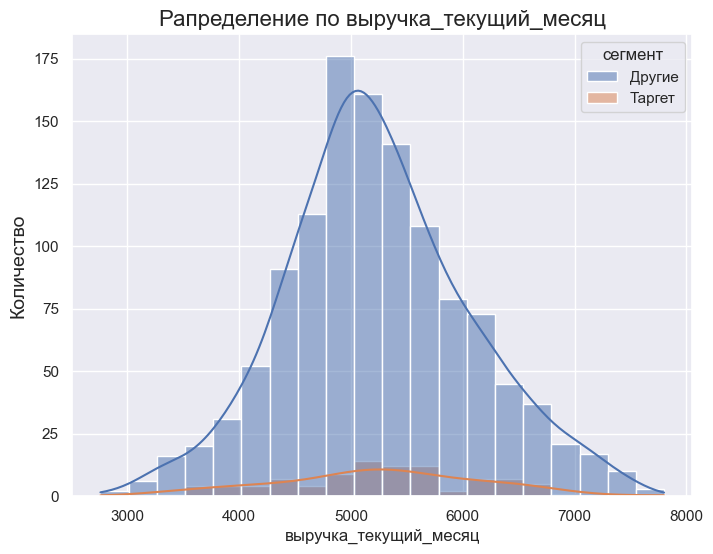

In [122]:
histogram(market, 'выручка_текущий_месяц', 'сегмент')

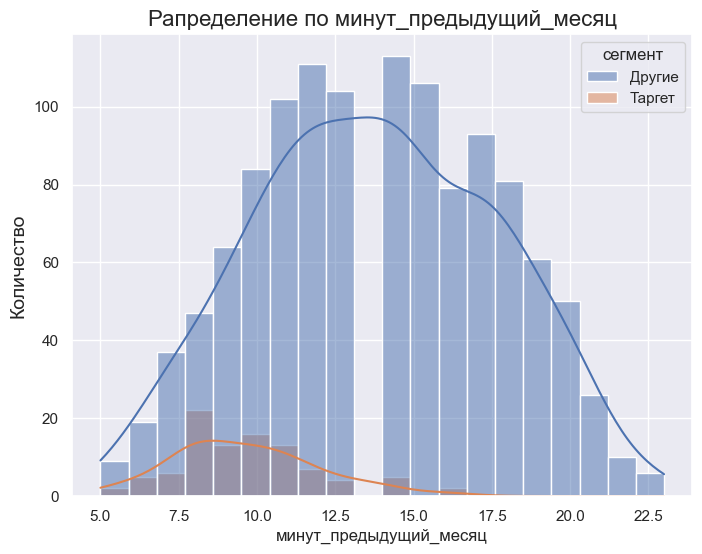

In [123]:
histogram(market, 'минут_предыдущий_месяц', 'сегмент')

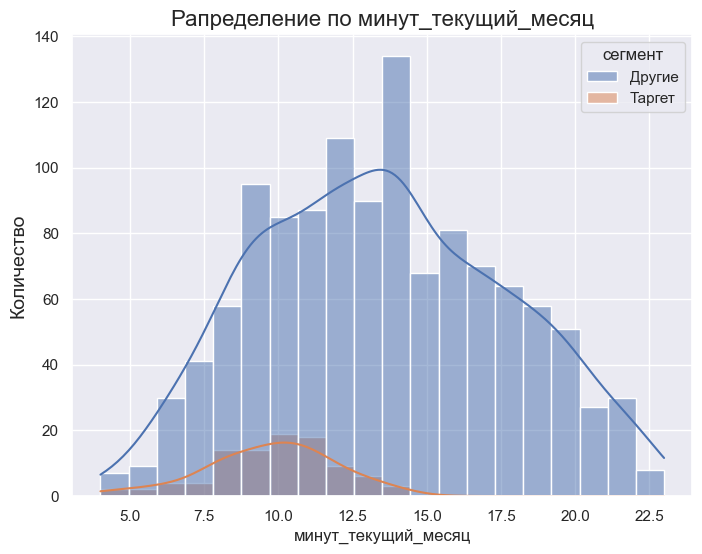

In [124]:
histogram(market, 'минут_текущий_месяц', 'сегмент')

### Выводы

Оценив наш таргет, мы можем прийти к выводу, что одной из наиболее значимых "проблем" наших клиентов является наличие детей, ну и в целом люди живут экономично.  

С детьми мы сделать ничего не можем, но можем предлагать немного больше акций для уходящих, пусть и с не значительной скидкой, но как сам факт

## Общий вывод

В данной работе у нас было 2 основные задачи:  
1) Получить модель, которая бы предсказывала спад покупательских показателей клиентов;  
2) Оценить "падающий" сегмент, выявить причины и предложить варианты решения.

В исходные данные заказчик предоставил нам следующую информацию:  
1) Активность клиента за последние 3 месяца;  
2) Активность клиентам на сайте;  
3) Выручку и доход по каждому клиенту;  

Из исходных данных были убраны клиенты, которые хотябя раз не делали покупок в разрезе месяцев  
Изменили типы данных в таблицах  
Обработали значения, приведя их к нормальному виду  
Объединили данные в одну базу для удобства работы

После чего произвели обучение модели через подбор оптимальных параметров и типа модели с помощью Optuna (GridSearchCV - очень долго, RandomSearchCV - много выпадает из выборки, что не хорошо).  

Таким образом лучшая модель и ее показатели -   

Параметры	Значение  
0	model	LogisticRegression  
2	scoring_metric	roc_auc  
3	pipeline	(ColumnTransformer(remainder='passthrough',\n ...  
7	C	48.45  
10	scoring_metric_train	0.86  
11	scoring_metric_test	0.85  



По таргету и сегменту - повторюсь, с детьми мы сделать ничего не можем, но можем предложить предоставлять немного больше акций для таргета, пусть и с не значительной скидкой, но как сам факт, это будет дополнительным стимулом для покупок